In [1]:
import sys
import os
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sys.path.append(os.path.abspath("../scripts"))

In [2]:
from data_loader import load_clean_data
from metrics import get_sentiment_proportions, compute_sentiment_ratios
from metrics import compute_ratios_comfort
from visualization import (
    plot_percentages, plot_stacked_bar_chart, plot_comfort, plot_exposure, plot_income, 
    plot_stacked_bar_chart_interaction
)
from sentiment_utils import (
    compute_sentiment_metrics, interpret_metrics, plot_sentiment_trend
)

In [3]:
data_path = "../data/muslim_brand_oct_2025.csv"
oct25 = load_clean_data(data_path)

In [4]:
oct25.head()

,Start Date,End Date,What is your religion?,Religion_other,How many Muslim people have you talked to in the last 7 days?,How do you feel about Muslim people in America?,What is your level of education?,Where do you get your news from?,News_other,How comfortable do you feel interacting with Muslims in your community?,...,Would you feel comfortable buying goods or services from a Muslim-owned business?,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?","How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",Do you feel you have a lot in common with Muslims in America?,"If you had questions about Islam or Muslims, where would you go to learn more?",Have you ever changed your opinion about a group of people after getting to know someone personally,Gender,Age,Major US Region,Household Income
0,10/13/2025 10:21:51 PM,10/13/2025 10:23:57 PM,Muslim,NaN,More than 10,Good,Graduate school,CNN,NaN,Very comfortable,...,Yes,Yes,A great deal,Yes,Religious Leaders,No,female,45_to_60,pacific,150000_to_174999
1,10/13/2025 09:15:42 PM,10/13/2025 09:17:14 PM,Christian (Other),NaN,None - 0,Neutral,Some College,Youtube,NaN,Neutral,...,Yes,No,A little,No,Internet,Yes,female,60_above,west_south_central,25000_to_49999
2,10/13/2025 09:10:04 PM,10/13/2025 09:11:16 PM,Atheist,NaN,None - 0,Neutral,Graduate school,Other (please specify),News Nation,Neutral,...,Yes,No,A little,No,Internet,Yes,male,45_to_60,pacific,100000_to_124999
3,10/13/2025 08:13:34 PM,10/13/2025 08:14:41 PM,Christian (Evangelical Protestant),NaN,2 to 4,Good,Graduate school,FOX News,NaN,Very comfortable,...,Yes,Yes,A great deal,Yes,Friends,No,female,45_to_60,east_north_central,25000_to_49999
4,10/13/2025 07:38:08 PM,10/13/2025 07:38:42 PM,Christian (Evangelical Protestant),NaN,5 to 10,Good,Graduate school,Twitter,NaN,Very comfortable,...,Yes,No,A great deal,Yes,Friends,Yes,female,45_to_60,mountain,150000_to_174999


In [5]:
oct25.columns

Index(['Start Date', 'End Date', 'What is your religion?', 'Religion_other',
       'How many Muslim people have you talked to in the last 7 days?',
       'How do you feel about Muslim people in America?',
       'What is your level of education?', 'Where do you get your news from?',
       'News_other',
       'How comfortable do you feel interacting with Muslims in your community?',
       'How often do you hear positive things about Muslims in the media?',
       'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?',
       'Would you feel comfortable buying goods or services from a Muslim-owned business?',
       'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?',
       'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?',
       'Do you feel you have a lot in common with Muslims in America?',
       'If you had questions about Isla

# Categories

1. Religion
2. Levels of Exposure
3. Education
4. News Source
5. Income Level
6. Gender
7. Age
8. Major US Region


# Questions

1. 'How do you feel about Muslim people in America?'
2. 'How comfortable do you feel interacting with Muslims in your community?'
3. 'How often do you hear positive things about Muslims in the media?'
4.   'In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?'
5. 'Would you feel comfortable buying goods or services from a Muslim-owned business?'
6. 'If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?'
7. 'How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?'
8. 'Do you feel you have a lot in common with Muslims in America?'
9. 'If you had questions about Islam or Muslims, where would you go to learn more?',
10. 'Have you ever changed your opinion about a group of people after getting to know someone personally'

# Current State of Muslims In the United States (July 2025-October 2025)

Here is a collection of articles circulating in the media during this time-frame. This could be a useful resource as we try and understand world events shaping these responses.

- October 17 2025: Political campaign surge in Islamophobia: The run of Zohran Mamdani in NYC has triggered intensified anti-Muslim rhetoric and scrutiny of his associations. \

- October 15 2025: Mosque expansion plans divide Long Island community. a Long Island town says its resistance to the expansion of a local mosque is based on traffic and public safety, but mosque leaders believe it’s due to anti-Muslim prejudice

- October 9 2025: Israel–Hamas ceasefire and hostages‑prisoners exchange
- October 19 2025: Israeli airstrikes resumed, citing breach of the truce

| Date                    | Headline & Source                                                                                                                                                          | Why It Matters                                                                                                                                                                                           |
| ----------------------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| Oct 20                  | **“Stefanik, Cotton urge Trump administration to probe Council on American‑Islamic Relations (CAIR) over ‘potential ties’ to Hamas”** — New York Post ([New York Post][1]) | Shows how U.S. political figures are challenging a major Muslim-American organization, signalling intense scrutiny and suspicion of Muslim institutions.                                                 |
| Oct 15                  | **“More U.S. Jews shield identity in public amid antisemitism fears, Post poll finds”** — Washington Post ([The Washington Post][2])                                       | While about Jewish Americans, this poll provides context: religious minorities (including Muslims) may feel vulnerable. Helps understand broader climate of religious-minority fear in the U.S.          |
| Oct 22 (or recent)      | **“FBI says a Louisiana resident assisted Hamas and lied on his U.S. visa application”** — Associated Press ([AP News][3])                                                 | Direct intersection of national security, immigration, Muslims, and U.S. legal system: may influence public perception of Muslims in America.                                                            |
| Oct 20                  | **“Alleged pro-Hamas Oct. 7 attacker granted religious accommodations while jailed in U.S.”** — New York Post ([New York Post][4])                                         | Highlights tension between religious accommodation rights and public outrage when the accused is linked to terrorism — complicates how Muslim religious practices are viewed.                            |
| Oct 20                  | **“Muslim groups call U.S. lawmakers to condemn Islamophobic remarks”** — Algemeiner ([Algemeiner.com][5])                                                                 | Shows activism from Muslim-American groups responding to perceived bias in Congress — relevant to how Muslim Americans see their political power and vulnerability.                                      |
| Oct 09                  | **“American Jews and Muslims celebrate cease-fire deal, but cautiously”** — ReligionNewsService ([RNS][6])                                                                 | Demonstrates how global events (Israel-Gaza ceasefire) resonate within American Muslim communities and how that affects their stance on U.S. foreign policy.                                             |
| Oct 08                  | **“’I don’t feel safe any more’: Dearborn’s Arab Americans on rising Islamophobia”** — The Guardian ([The Guardian][7])                                                    | Focuses on Arab-American/Muslim experiences in a U.S. city, showing lived fears and local community response. Very relevant to “views of Americans” and how Muslims feel they are seen.                  |
| Oct 06                  | **“How American views on Israel and antisemitism have changed since Oct. 7”** — PBS NewsHour ([PBS][8])                                                                    | While focused on Jews/Israel, this shows how U.S. public opinion shifts in tandem with Middle East events — helps illuminate backdrop for Muslim-American views too.                                     |
| Oct 20                  | **“Religion Is Gaining Influence in American Life, More U.S. Adults Say”** — Pew Research ([Pew Research Center][9])                                                       | Offers quantitative context: more Americans feel their religious beliefs conflict with mainstream culture — helpful for understanding how Muslims (as religious minorities) might fit into that tension. |
| ~Sept (date in article) | **“Sen. Cornyn of Texas says federal probe started into Muslim-centered community near Dallas”** — Associated Press ([AP News][10])                                        | A case of U.S. government investigation targeting a Muslim-centered development, highlighting institutional pressures on Muslim communities in America.                                                  |

[1]: https://nypost.com/2025/10/14/us-news/elise-stefanik-tom-cotton-push-trump-admin-to-probe-cair-for-potential-hamas-financial-link/?utm_source=chatgpt.com "Stefanik, Cotton urge Trump administration to probe CAIR over 'potential ties' to Hamas"
[2]: https://www.washingtonpost.com/nation/2025/10/15/us-jews-poll-safety-antisemitism/?utm_source=chatgpt.com "More U.S. Jews shield identity in public amid antisemitism fears, Post poll finds"
[3]: https://apnews.com/article/70361e09338f9f669ab1beade9af2ad9?utm_source=chatgpt.com "FBI says a Louisiana resident assisted Hamas and lied on his US visa application"
[4]: https://nypost.com/2025/10/20/us-news/alleged-pro-hamas-oct-7-attacker-granted-religious-accommodations-while-jailed/?utm_source=chatgpt.com "Alleged pro-Hamas Oct. 7 attacker granted religious accommodations while jailed in Louisiana"
[5]: https://www.algemeiner.com/2025/10/20/muslim-groups-call-us-lawmakers-condemn-jewish-rep-randy-fine-islamophobic-attack-mamdani/?utm_source=chatgpt.com "Muslim Groups Call on US Lawmakers to Condemn Jewish ..."
[6]: https://religionnews.com/2025/10/09/american-jews-and-muslims-celebrate-ceasefire-deal-but-cautiously/?utm_source=chatgpt.com "American Jews and Muslims celebrate ceasefire deal, but ..."
[7]: https://www.theguardian.com/us-news/2025/oct/08/arab-americans-michigan-dearborn-trump?utm_source=chatgpt.com "'I don't feel safe any more': Dearborn's Arab Americans on rising Islamophobia"
[8]: https://www.pbs.org/newshour/nation/how-american-views-on-israel-and-antisemitism-have-changed-since-oct-7?utm_source=chatgpt.com "How American views on Israel and antisemitism have ..."
[9]: https://www.pewresearch.org/religion/2025/10/20/growing-share-of-us-adults-say-religion-is-gaining-influence-in-american-life/?utm_source=chatgpt.com "Religion Is Gaining Influence in American Life, More U.S. ..."
[10]: https://apnews.com/article/d46c19cf662f249e24a3db12aee2395c?utm_source=chatgpt.com "Sen. Cornyn of Texas says federal probe started into Muslim-centered community near Dallas"


# Compute Key Metrics

In [7]:
# Sentiment proportions
sentiment_prop = get_sentiment_proportions(oct25, 'How do you feel about Muslim people in America?')
display(sentiment_prop)

# Ratios
pos_neg_ratio, pos_neutral_ratio = compute_sentiment_ratios(oct25, \
                                                            'How do you feel about Muslim people in America?')
net_sentiment_oct_25 = sentiment_prop.iloc[0,1]-sentiment_prop.iloc[2,1]
net_sentiment_july_25= 57.66

print(f"Positive to Negative Ratio: {pos_neg_ratio:.2f}")
print(f"Positive to Neutral Ratio: {pos_neutral_ratio:.2f}")
print(f"Net Sentiment Score: {net_sentiment_oct_25:.2f}")
print(f"Quartely change in net sentiment score:{net_sentiment_oct_25-net_sentiment_july_25}")
print(f"Net sentiment Oct 2025:{net_sentiment_oct_25}")


,Category,Percentage
0,Good,56.910569
1,Neutral,35.772358
2,Bad,7.317073


Positive to Negative Ratio: 7.78
Positive to Neutral Ratio: 1.59
Net Sentiment Score: 49.59
Quartely change in net sentiment score:-8.066504065040647
Net sentiment Oct 2025:49.59349593495935


# Comfort Metric

In [7]:
question = 'How comfortable do you feel interacting with Muslims in your community?'
comfort_level = get_sentiment_proportions(oct25, question)

In [8]:
comfort_level

,Category,Percentage
0,Very comfortable,41.463415
1,Comfortable,34.146341
2,Neutral,17.886179
3,Uncomfortable,6.504065


In [9]:
ratios = compute_ratios_comfort(comfort_level)

In [10]:
ratios

Very comfortable / Neutral          2.318182
Comfortable / Neutral               1.909091
Very comfortable / Uncomfortable    6.375000
Comfortable / Uncomfortable         5.250000
Name: Ratio, dtype: float64

# Visualizations

# Overall Public Opinion

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Public_Opinion_on_Muslims_October_2025.png


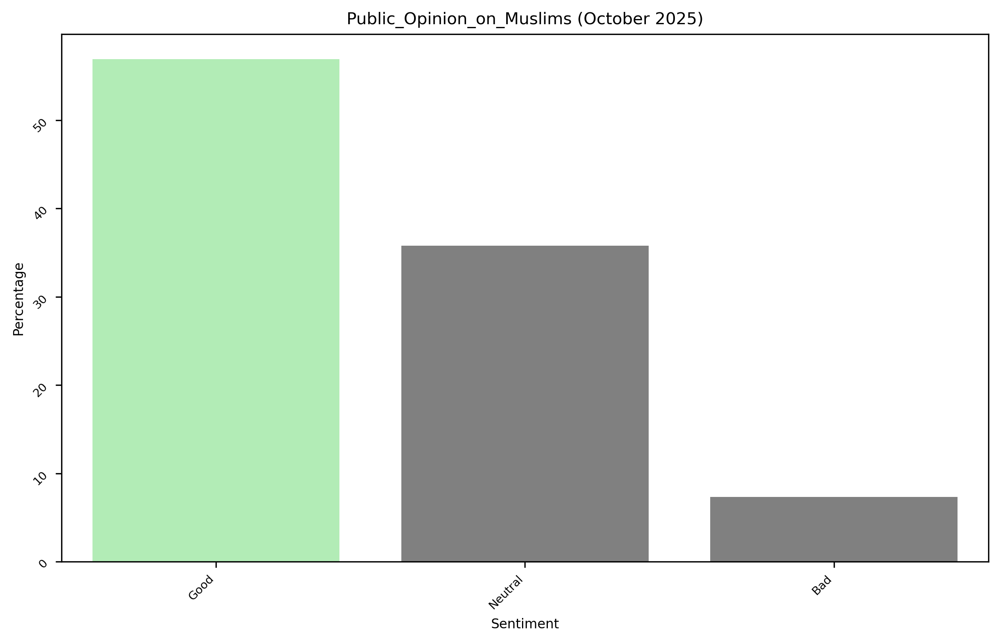

In [11]:
plot_percentages(oct25,
                 column_name='How do you feel about Muslim people in America?',
                 x_label='Sentiment',
                 title='Public_Opinion_on_Muslims (October 2025)')

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Comfort_levels_Around_Muslims_in_America_October_2025.png


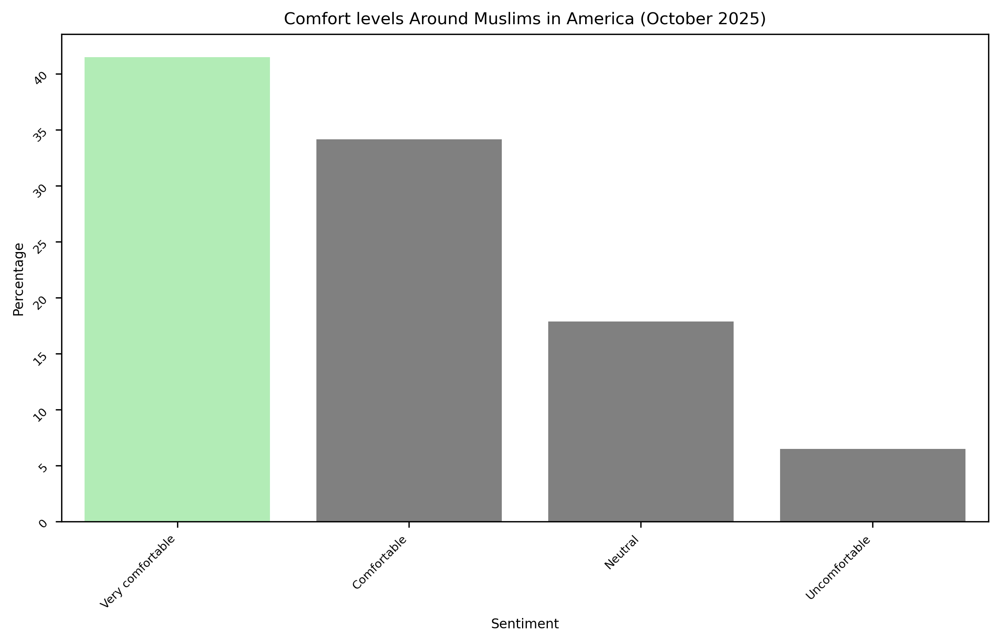

In [12]:
plot_percentages(oct25,
                 column_name='How comfortable do you feel interacting with Muslims in your community?',
                 x_label='Sentiment',
                 title='Comfort levels Around Muslims in America (October 2025)')

# Religion Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_of_Religion_October_2025.png


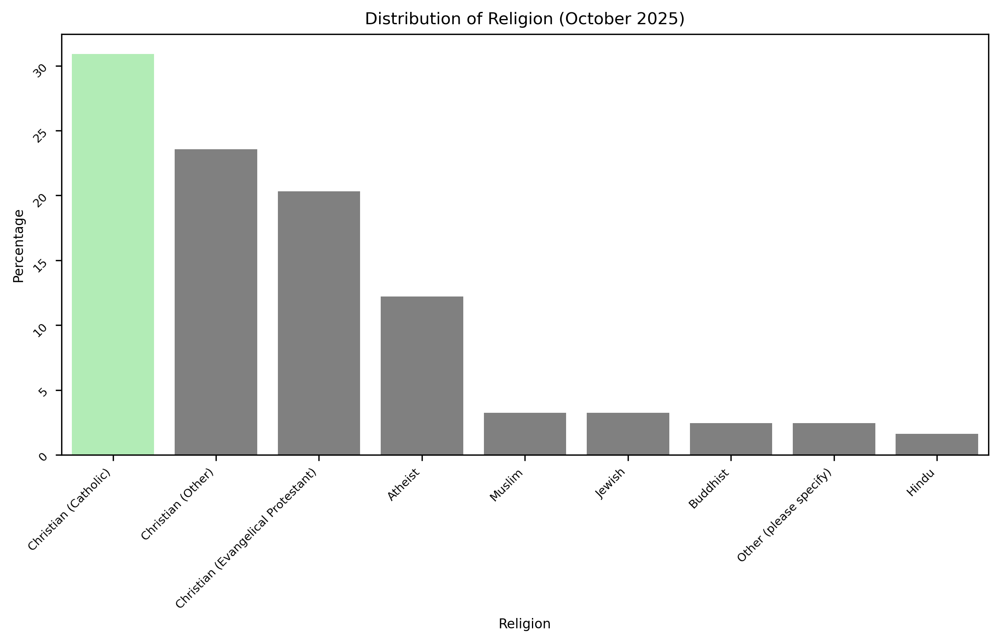

In [13]:
plot_percentages(oct25,
                 column_name='What is your religion?',
                 x_label='Religion',
                 title='Distribution of Religion (October 2025)')

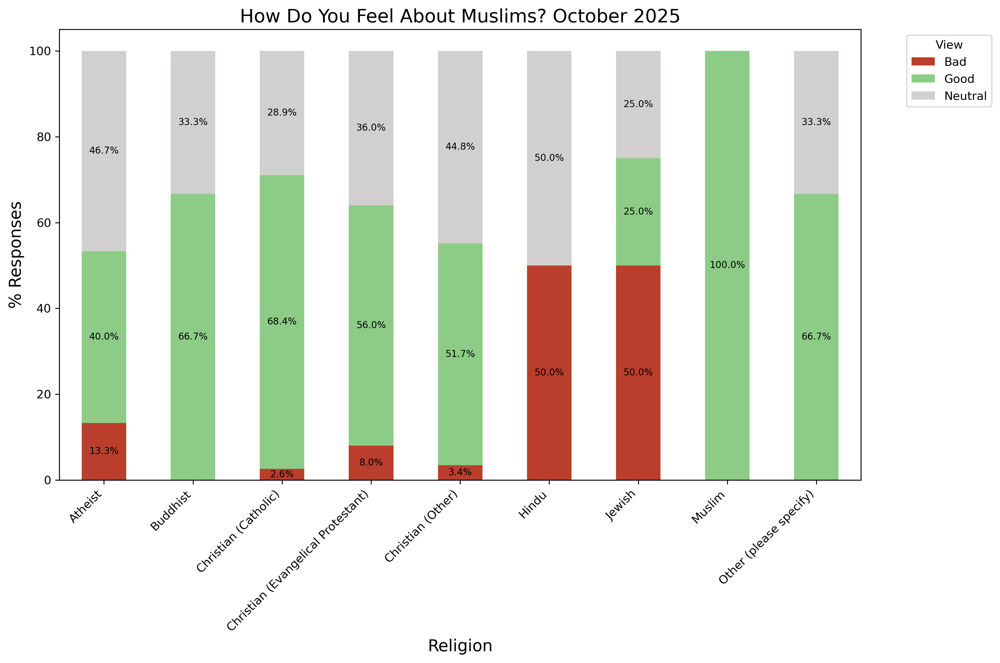

In [14]:
plot_stacked_bar_chart(oct25,
                       title='How Do You Feel About Muslims? October 2025',
                       xlabel='Religion',
                       ylabel='% Responses',
                       cat_col='What is your religion?',
                       sent_col='How do you feel about Muslim people in America?')

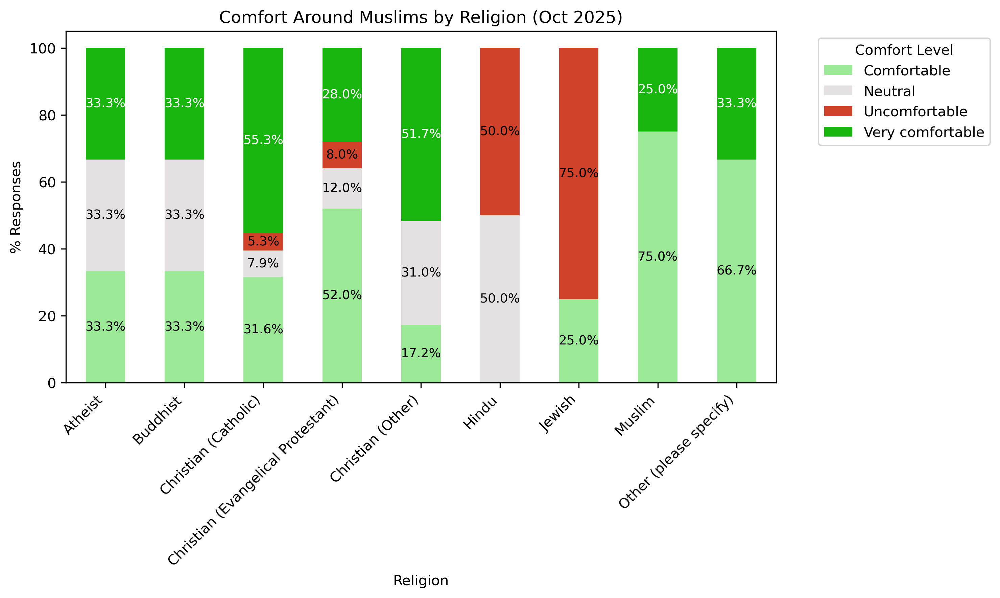

In [15]:
plot_comfort(oct25,
             category_col='What is your religion?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Religion (Oct 2025)',
             xlabel='Religion',
             ylabel='% Responses')

# Gender Vs. Sentiment

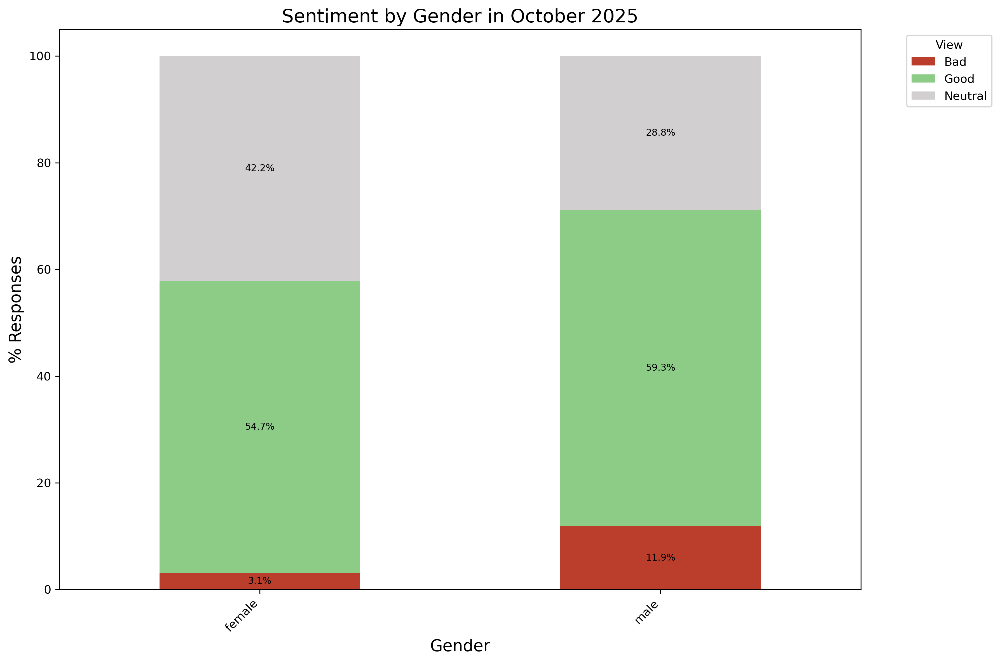

In [16]:
plot_stacked_bar_chart(oct25,
                       title='Sentiment by Gender in October 2025',
                       xlabel='Gender',
                       ylabel='% Responses',
                       cat_col='Gender',
                       sent_col='How do you feel about Muslim people in America?')

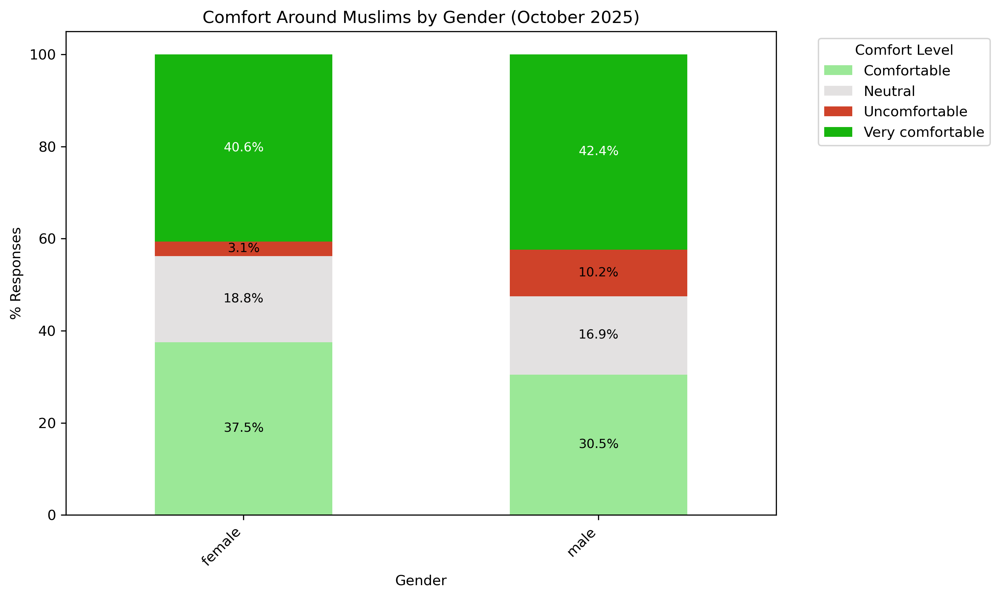

In [17]:
plot_comfort(oct25,
             category_col= 'Gender',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Gender (October 2025)',
             xlabel='Gender',
             ylabel='% Responses')

# Education Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/The_Majority_of_Those_Surveyed_Hold_Degrees_In_Higher_Education.png


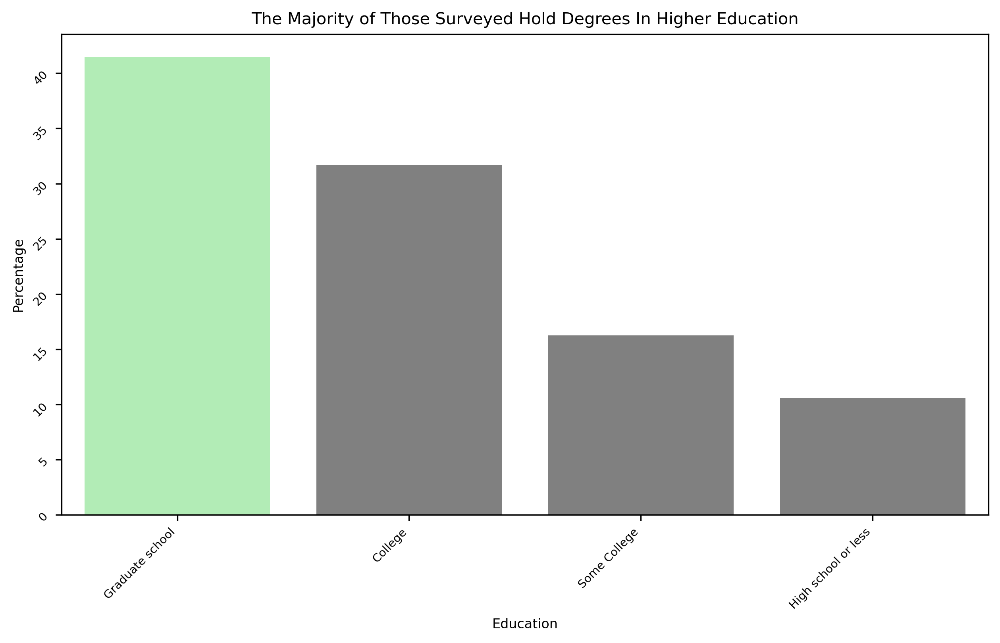

In [18]:
plot_percentages(oct25,'What is your level of education?', 'Education',
           'The Majority of Those Surveyed Hold Degrees In Higher Education')

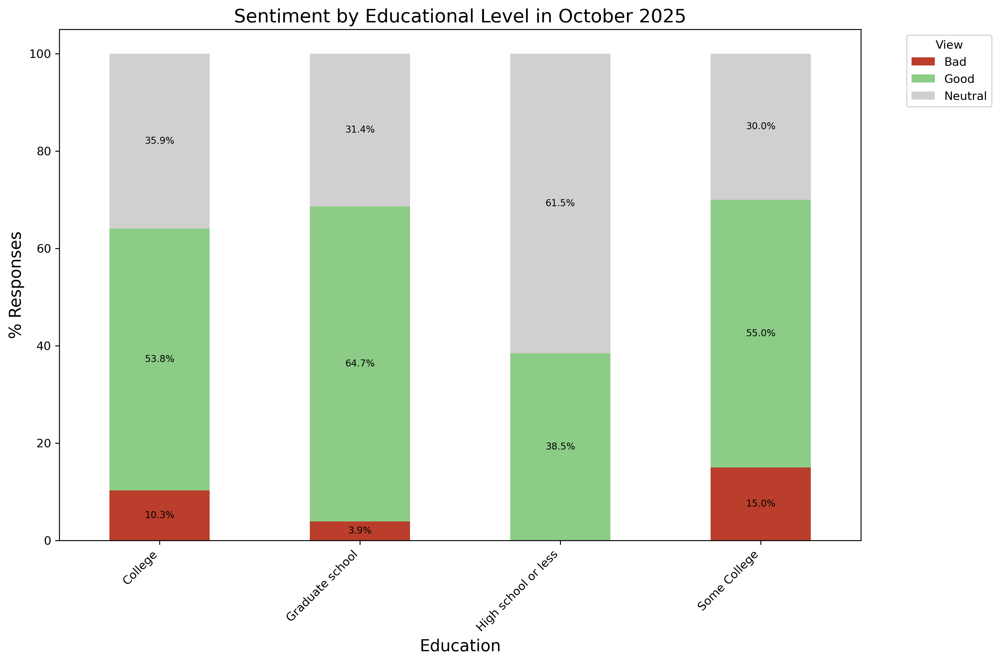

In [19]:
plot_stacked_bar_chart(oct25,
                       title='Sentiment by Educational Level in October 2025',
                       xlabel='Education',
                       ylabel='% Responses',
                       cat_col='What is your level of education?',
                       sent_col='How do you feel about Muslim people in America?')

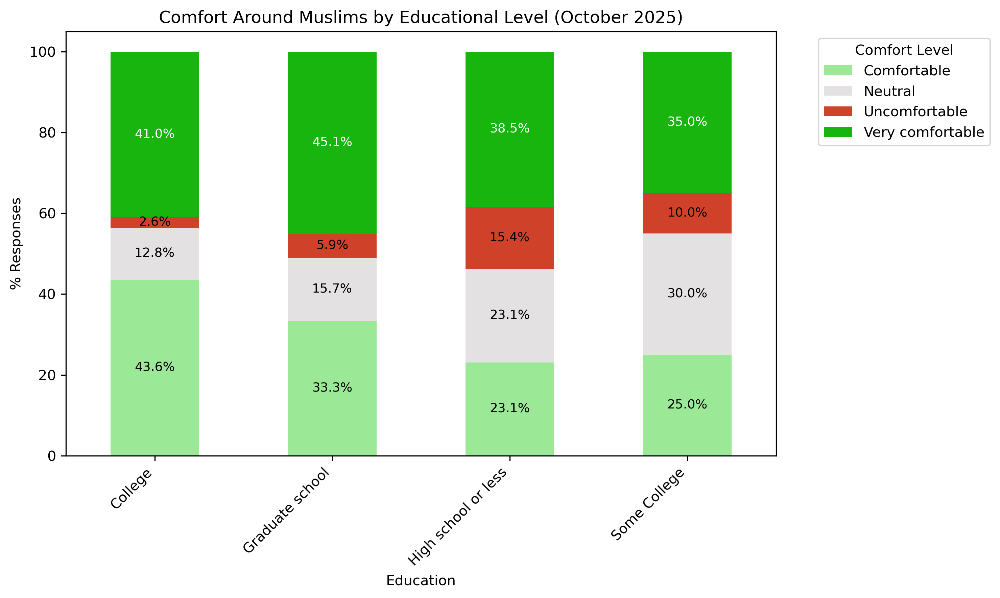

In [20]:
plot_comfort(oct25,
             category_col= 'What is your level of education?',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (October 2025)',
             xlabel='Education',
             ylabel='% Responses')

# Age Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/45%_Of_Survey_Partipants_are_aged_30-44_October_2025.png


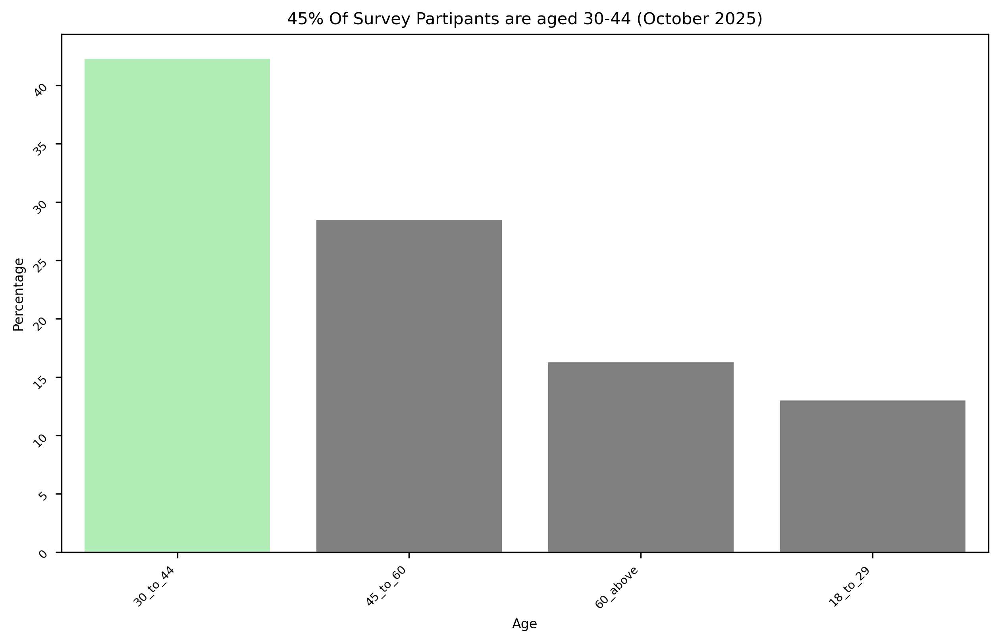

In [25]:
plot_percentages(oct25,'Age', 'Age',
           '45% Of Survey Partipants are aged 30-44 (October 2025)')

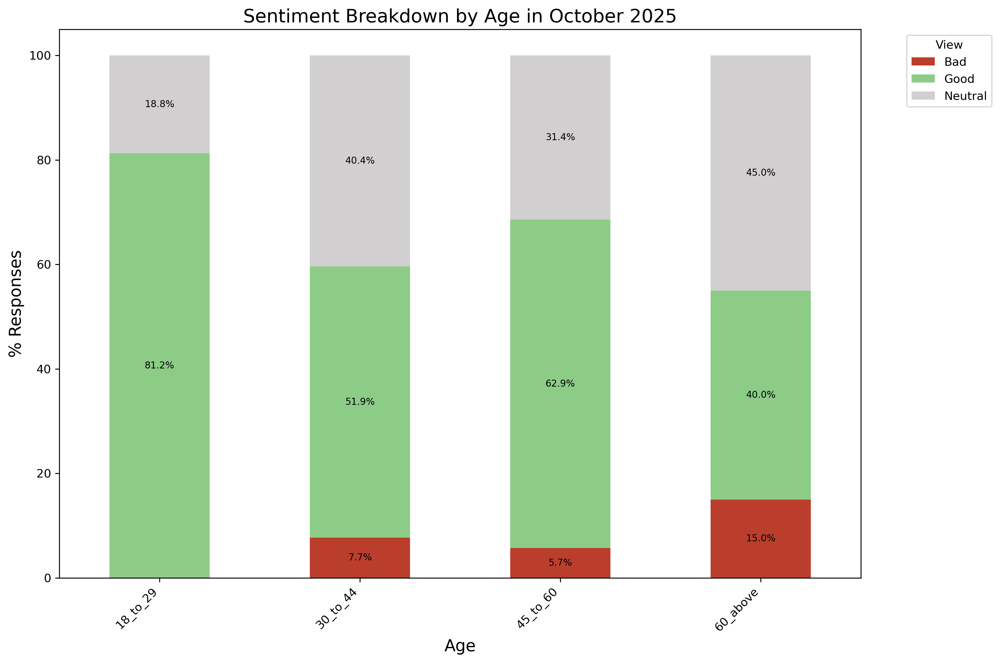

In [27]:
plot_stacked_bar_chart(oct25,
                       title='Sentiment Breakdown by Age in October 2025',
                       xlabel='Age',
                       ylabel='% Responses',
                       cat_col='Age',
                       sent_col='How do you feel about Muslim people in America?')

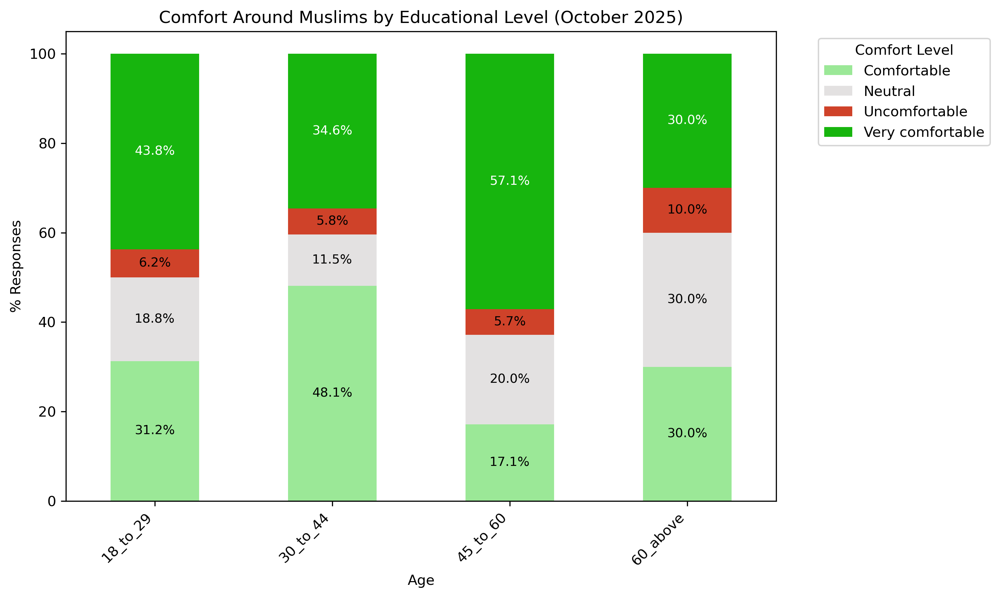

In [28]:
plot_comfort(oct25,
             category_col= 'Age',
             comfort_level='How comfortable do you feel interacting with Muslims in your community?',
             title='Comfort Around Muslims by Educational Level (October 2025)',
             xlabel='Age',
             ylabel='% Responses')

# Income Vs. Sentiment

In [31]:
income_mapping = {"25000_to_49999": "25k-49k",
"50000_to_74999":"50k-74k",
"75000_to_99999": "75k-99k",
"125000_to_149999": "125k-149k",
"100000_to_124999" :"100k-124k",
"0_to_9999"        : "0-9k",
"no_answer":    "undisclosed",
"150000_to_174999":"150k-174k",
"10000_to_24999" : "10k-24k",
"200000_and_up":   "200k_up",
"175000_to_199999": "175k-199k"}

oct25['Household Income']= oct25['Household Income'].replace(income_mapping)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Most_Survey_Respondents_Are_Upper_Middle_Class_Earners.png


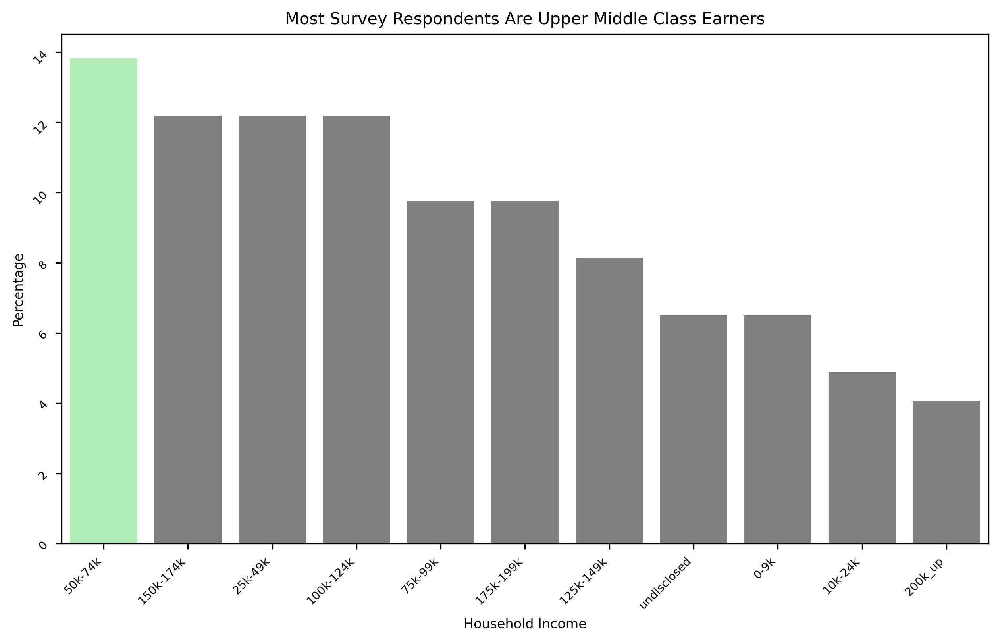

In [33]:
plot_percentages(oct25,'Household Income', 'Household Income',
           'Most Survey Respondents Are Upper Middle Class Earners')

In [34]:
income_brackets = { "25k-49k":'low',
"50k-74k":"mid",
"75k-99k":"mid",
"125k-149k":"mid",
"100k-124k":"mid",
 "0-9k":"low",
"undisclosed":"undisclosed",
"150k-174k":"high",
"10k-24k":"low",
 "200k_up":"high",
"175k-199k":"high"}

In [35]:
oct25['Household_Income'] = oct25['Household Income'].replace(income_brackets)

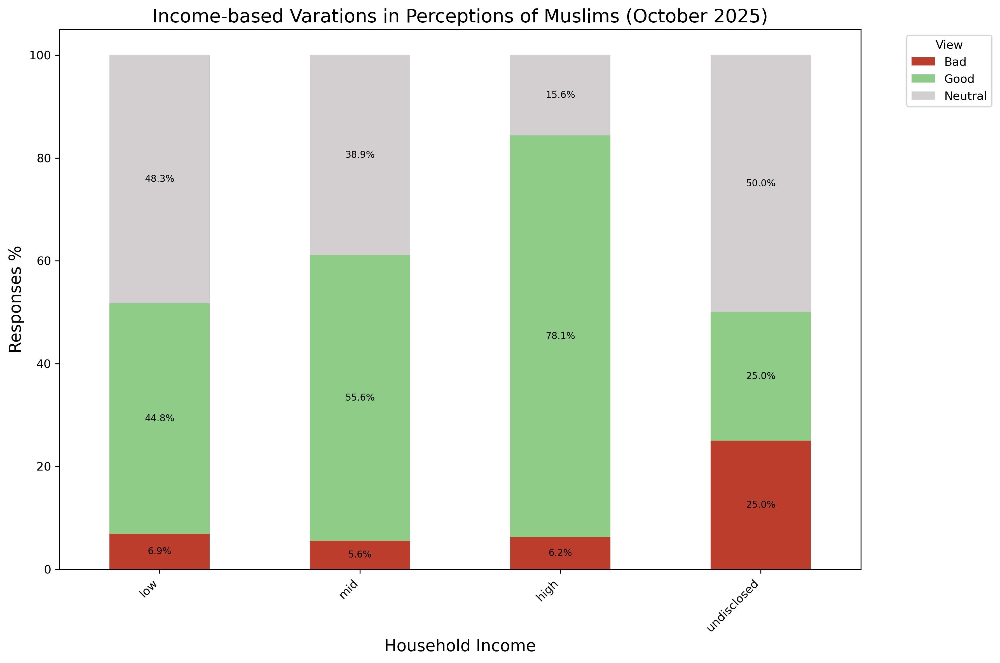

In [36]:
order = ['low','mid','high', 'undisclosed']

plot_income(
    df=oct25, 
    title='Income-based Varations in Perceptions of Muslims (October 2025)',
    xlabel='Household Income',
    ylabel='Responses %',
    cat_col='Household_Income',
    sent_col='How do you feel about Muslim people in America?',
    cat_order=order
)

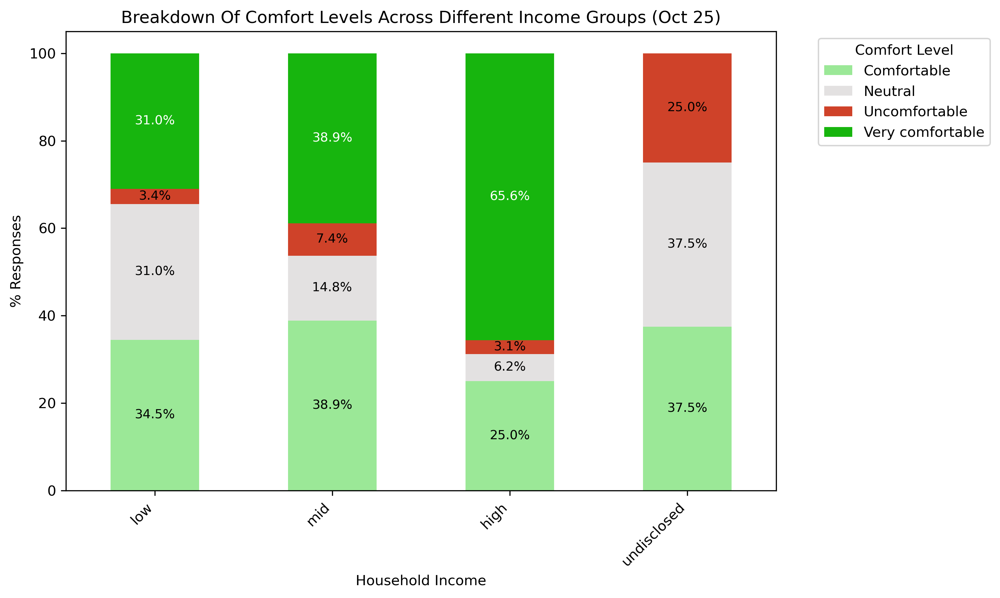

In [39]:
plot_comfort(
    df= oct25, 
    category_col= 'Household_Income',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Income Groups (Oct 25)',
    xlabel='Household Income',
    ylabel='% Responses',
)

# Region Vs Sentiment and Comfort

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_Half_of_Survey_Participants_Come_From_South_Atlantic_and_Pacific_Regions.png


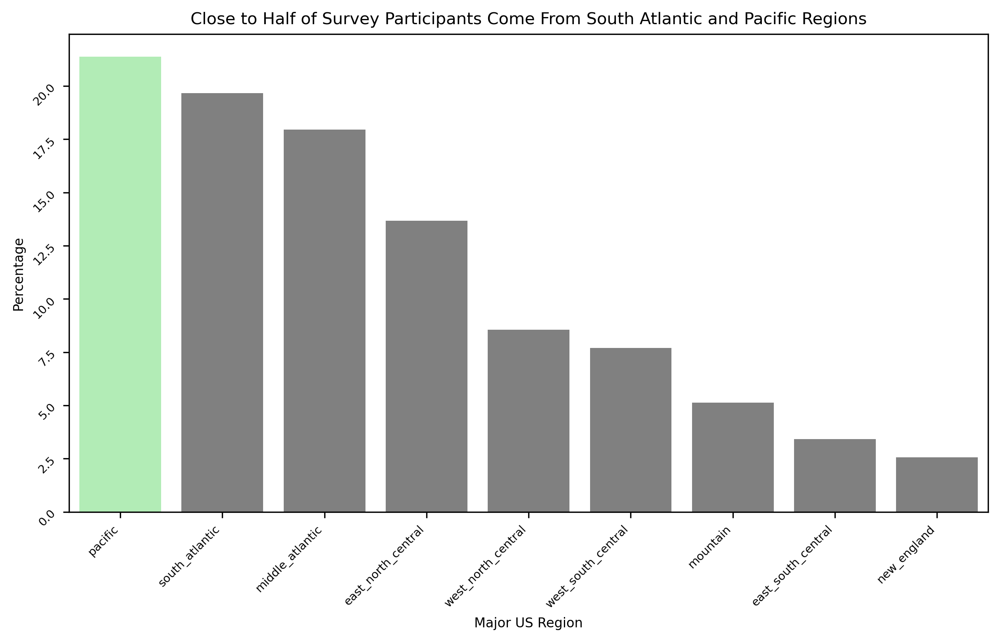

In [41]:
plot_percentages(oct25,'Major US Region', 'Major US Region',
                 'Close to Half of Survey Participants Come From South Atlantic and Pacific Regions')

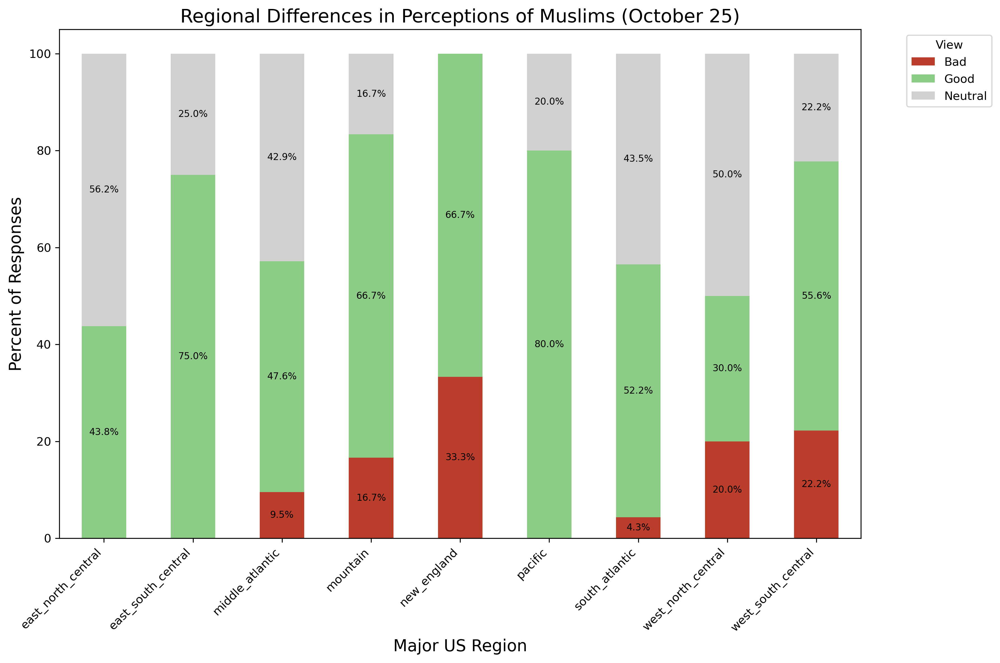

In [42]:
plot_stacked_bar_chart(
    df=oct25, 
    title='Regional Differences in Perceptions of Muslims (October 25)',
    xlabel='Major US Region',
    ylabel='Percent of Responses',
    cat_col='Major US Region',
    sent_col='How do you feel about Muslim people in America?'
)

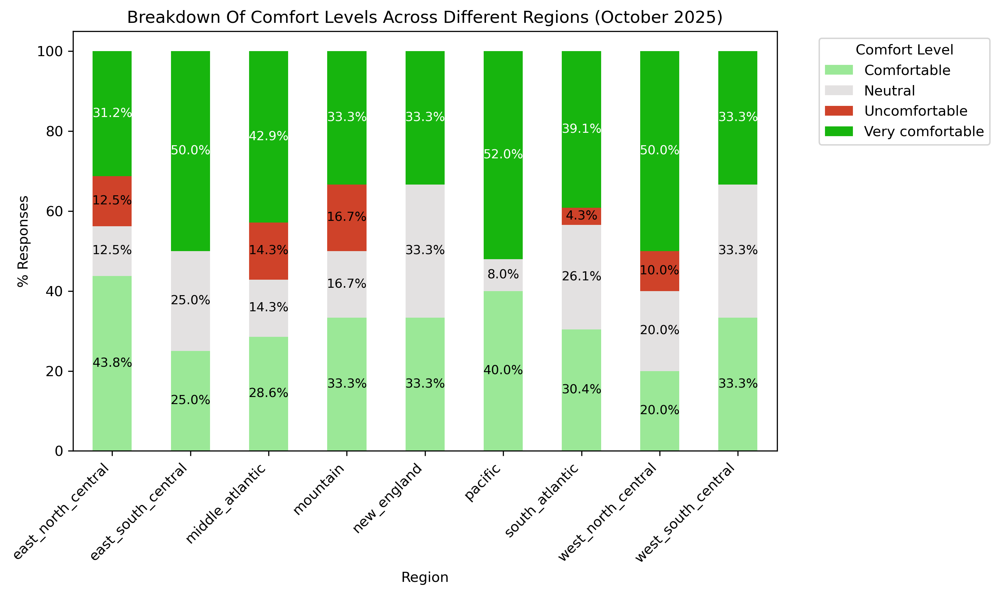

In [45]:
plot_comfort(
    df= oct25, 
    category_col= 'Major US Region',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different Regions (October 2025)',
    xlabel='Region',
    ylabel='% Responses',
)

# Relationship Between Knowing a Muslim and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Around_60%_Of_Respondents_Have_Spoken_to_At_Least_One_Muslim_in_the_Last_7_days_Oct_25.png


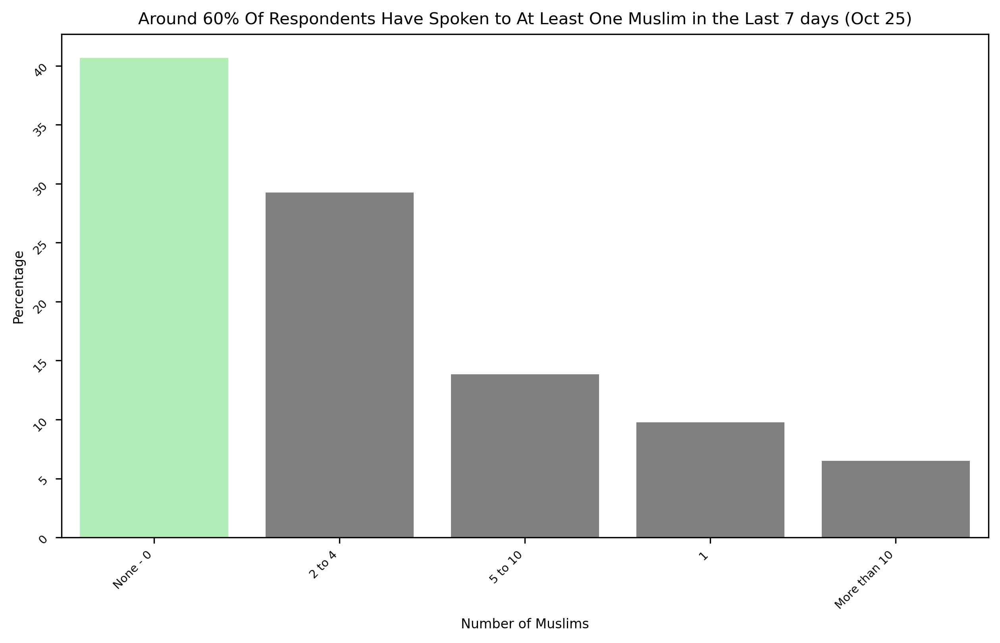

In [49]:
plot_percentages(oct25,'How many Muslim people have you talked to in the last 7 days?', 'Number of Muslims',\
           'Around 60% Of Respondents Have Spoken to At Least One Muslim in the Last 7 days (Oct 25)')

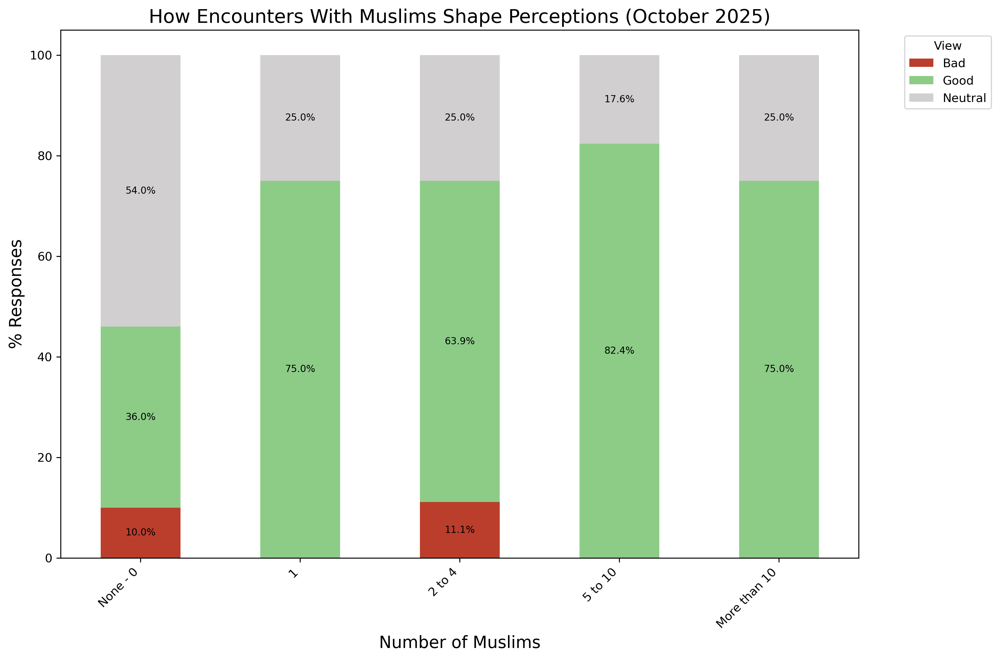

<Figure size 7200x4000 with 0 Axes>

In [50]:
plot_stacked_bar_chart_interaction(
    df=oct25, 
    title='How Encounters With Muslims Shape Perceptions (October 2025)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

In [55]:
oct25_non_muslim = oct25[oct25['What is your religion?'] != 'Muslim']

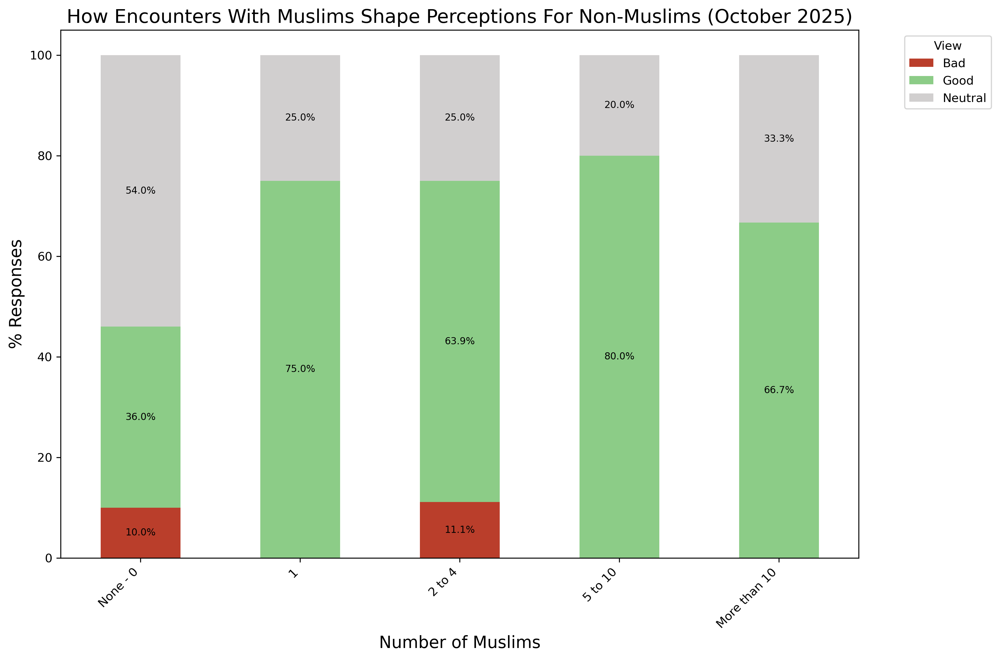

<Figure size 7200x4000 with 0 Axes>

In [57]:
plot_stacked_bar_chart_interaction(
    df=oct25_non_muslim, 
    title='How Encounters With Muslims Shape Perceptions For Non-Muslims (October 2025)',
    xlabel='Number of Muslims',
    ylabel='% Responses',
    cat_col='How many Muslim people have you talked to in the last 7 days?',
    sent_col='How do you feel about Muslim people in America?'
)

<Axes: xlabel='How many Muslim people have you talked to in the last 7 days?'>

Text(0.5, 1.0, "Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (Oct 2025)")

Text(0.5, 0, 'Number of Muslim People Talked To')

Text(0, 0.5, 'Percentage of Respondents')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1'),
  Text(1, 0, '2 to 4'),
  Text(2, 0, '5 to 10'),
  Text(3, 0, 'More than 10'),
  Text(4, 0, 'None - 0')])

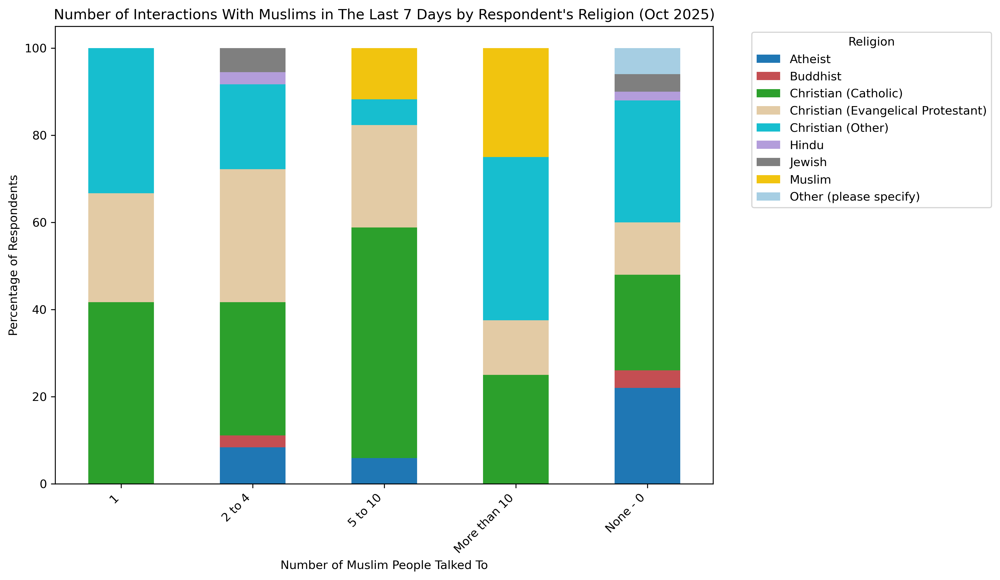

In [58]:
import matplotlib.pyplot as plt

counts = oct25.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'What is your religion?']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Religion (Oct 2025)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Religion", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='How many Muslim people have you talked to in the last 7 days?'>

Text(0.5, 1.0, "Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (October 2025)")

Text(0.5, 0, 'Number of Muslim People Talked To')

Text(0, 0.5, 'Percentage of Respondents')

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, '1'),
  Text(1, 0, '2 to 4'),
  Text(2, 0, '5 to 10'),
  Text(3, 0, 'More than 10'),
  Text(4, 0, 'None - 0')])

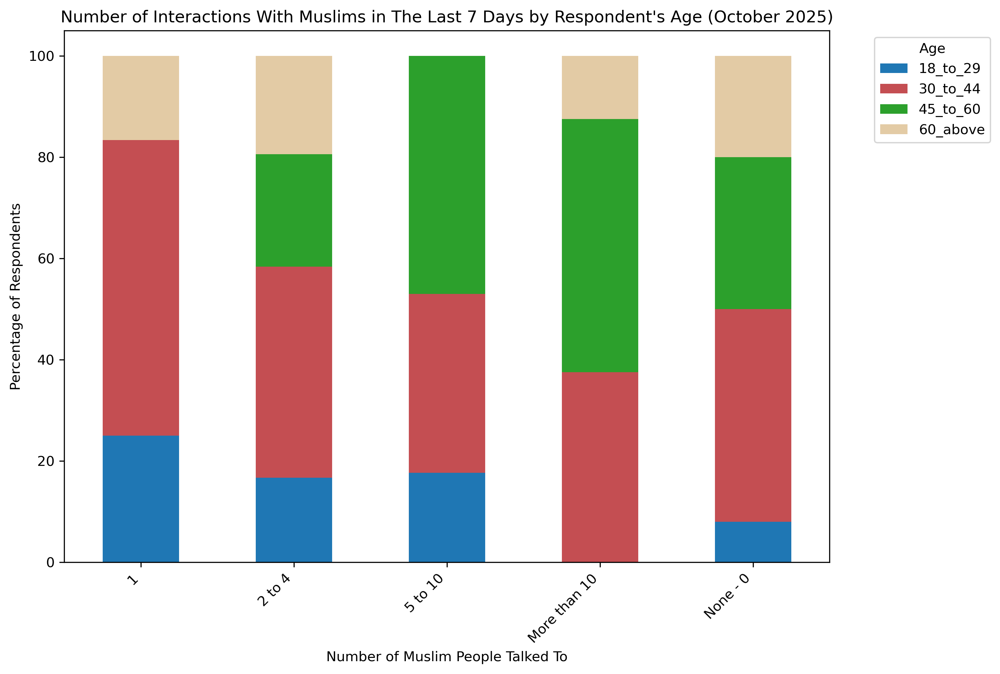

In [59]:
counts = oct25.groupby(['How many Muslim people have you talked to in the last 7 days?', 
                        'Age']).size().unstack()

# Convert counts to percentages
percentages = counts.div(counts.sum(axis=1), axis=0) * 100

# Plotting
percentages.plot(kind='bar', stacked=True, figsize=(10, 7), \
                 color = ['#1f77b4', '#c44e52', '#2ca02c', '#e3cba5', '#17becf',
          '#b39ddb', '#7f7f7f', '#f1c40f', '#a6cee3', '#e7969c']

)

plt.title("Number of Interactions With Muslims in The Last 7 Days by Respondent's Age (October 2025)")
plt.xlabel("Number of Muslim People Talked To")
plt.ylabel("Percentage of Respondents")
plt.xticks(rotation=45, ha='right') 

plt.legend(title="Age", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# News Source Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/News_Source_Distribution_October_2025.png


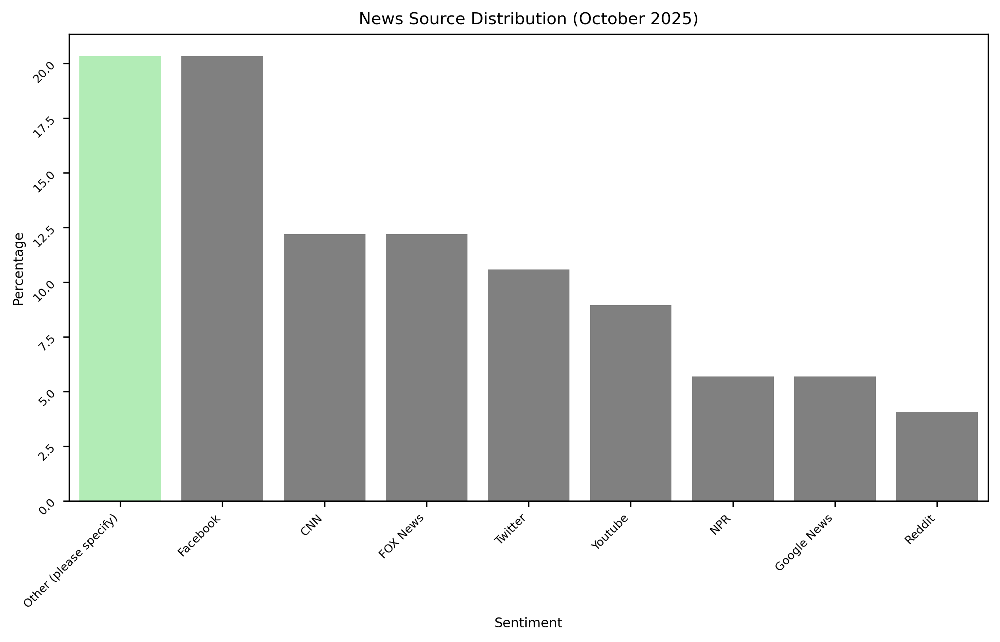

In [60]:
plot_percentages(oct25,
                 column_name='Where do you get your news from?',
                 x_label='Sentiment',
                 title='News Source Distribution (October 2025)')

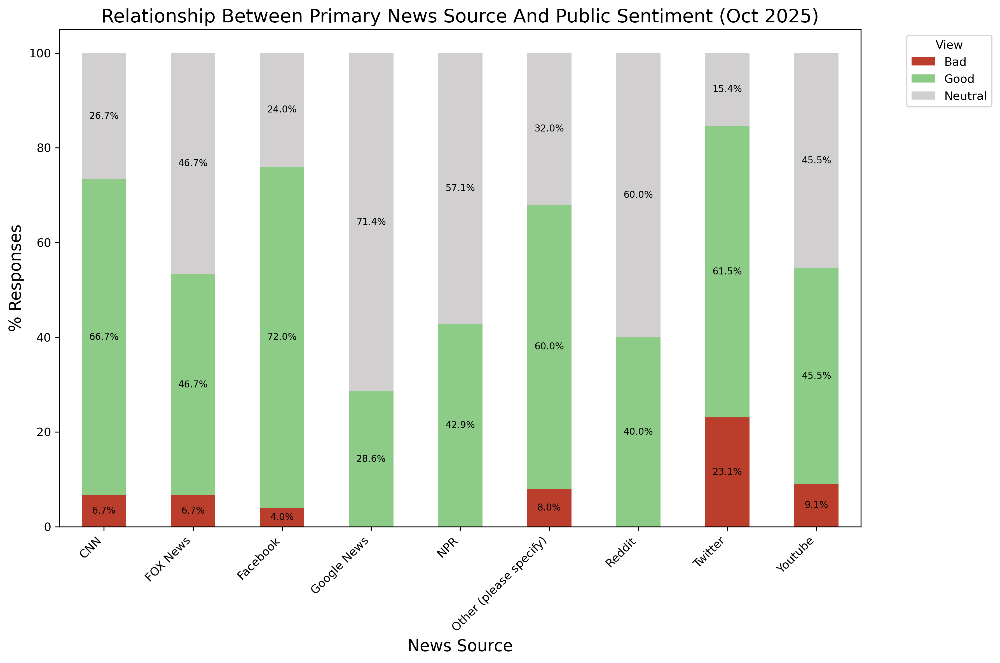

In [61]:
plot_stacked_bar_chart(
    df=oct25, 
    title='Relationship Between Primary News Source And Public Sentiment (Oct 2025)',
    xlabel='News Source',
    ylabel='% Responses',
    cat_col= 'Where do you get your news from?',
    sent_col='How do you feel about Muslim people in America?'
)

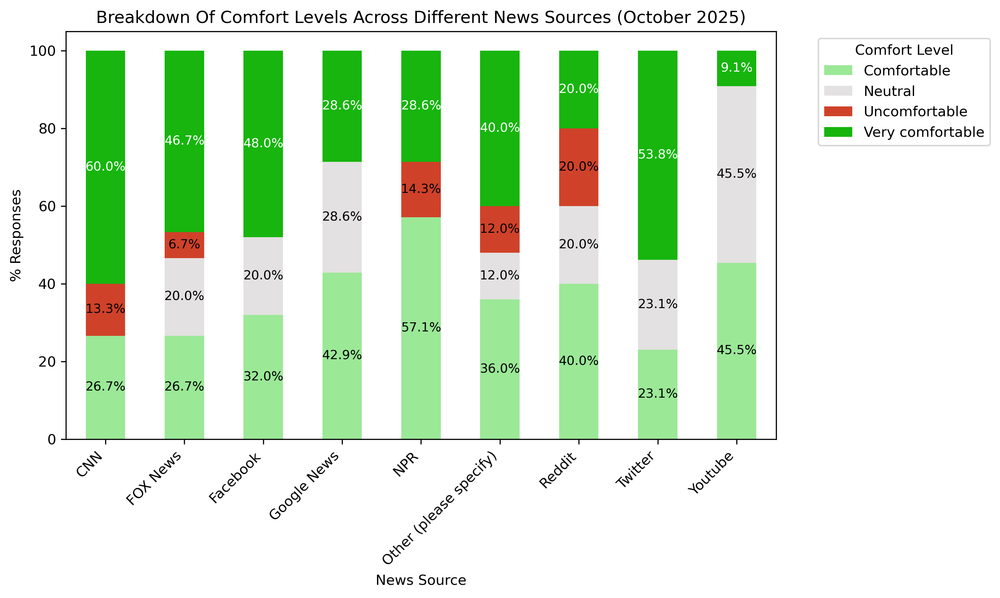

In [63]:
plot_comfort(
    df= oct25, 
    category_col= 'Where do you get your news from?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Different News Sources (October 2025)',
    xlabel='News Source',
    ylabel='% Responses',
)

## Relationship Between Exposure to Positive Portrayal and Overall Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Only_35%_Of_Respondents_Reported_Seeing_Positive_Stories_About_Muslims_in_the_Media_July_2025.png


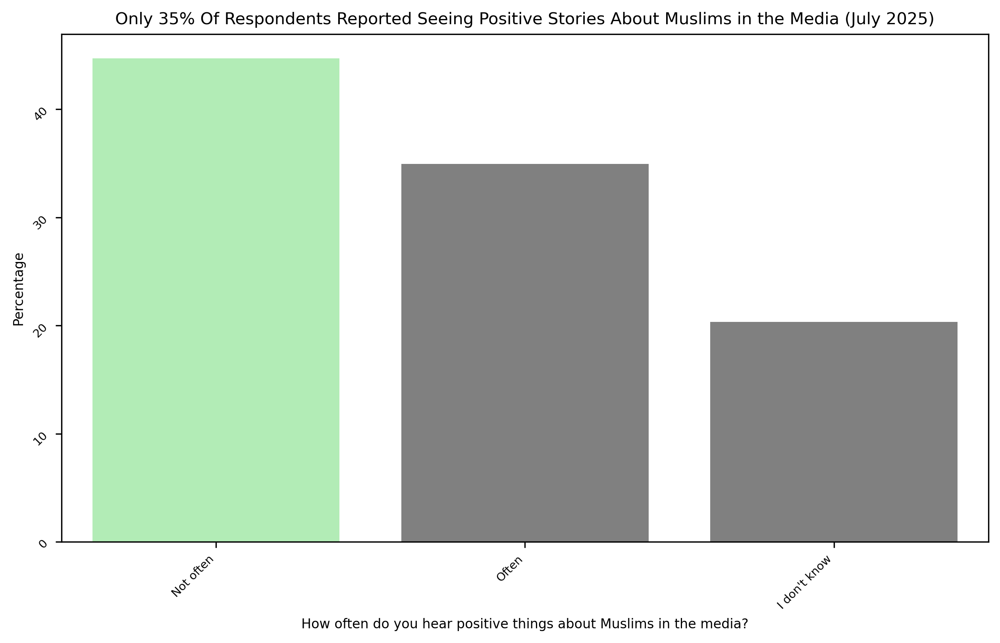

In [67]:
plot_percentages(oct25,'How often do you hear positive things about Muslims in the media?', 'How often do you hear positive things about Muslims in the media?',
           'Only 35% Of Respondents Reported Seeing Positive Stories About Muslims in the Media (July 2025)')

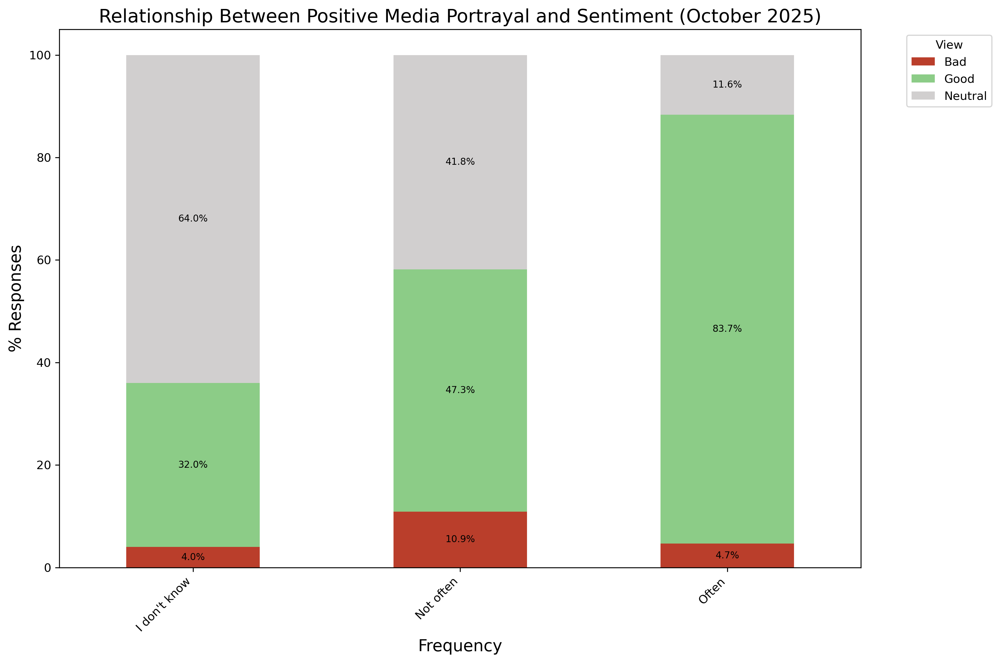

In [64]:
plot_stacked_bar_chart(
    df=oct25, 
    title='Relationship Between Positive Media Portrayal and Sentiment (October 2025)',
    xlabel='Frequency',
    ylabel='% Responses',
    cat_col= 'How often do you hear positive things about Muslims in the media?',
    sent_col='How do you feel about Muslim people in America?'
)

In [68]:
pd.crosstab(
    oct25['Where do you get your news from?'],
    oct25['How often do you hear positive things about Muslims in the media?']
)

How often do you hear positive things about Muslims in the media?,I don't know,Not often,Often
Where do you get your news from?,,,
CNN,2,7,6
FOX News,1,4,10
Facebook,8,4,13
Google News,4,2,1
NPR,1,5,1
Other (please specify),8,16,1
Reddit,1,4,0
Twitter,0,5,8
Youtube,0,8,3


## Relationship Between Gender and Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/55%_of_the_Survey_Participants_Were_Women_October2025.png


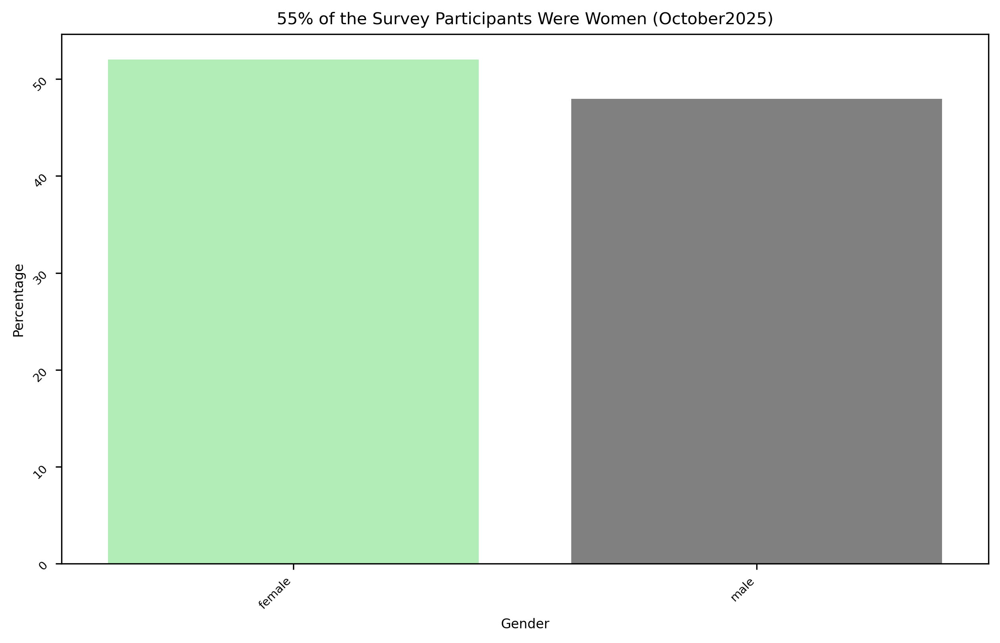

In [71]:
plot_percentages(oct25,'Gender', 'Gender',
           '55% of the Survey Participants Were Women (October2025)')

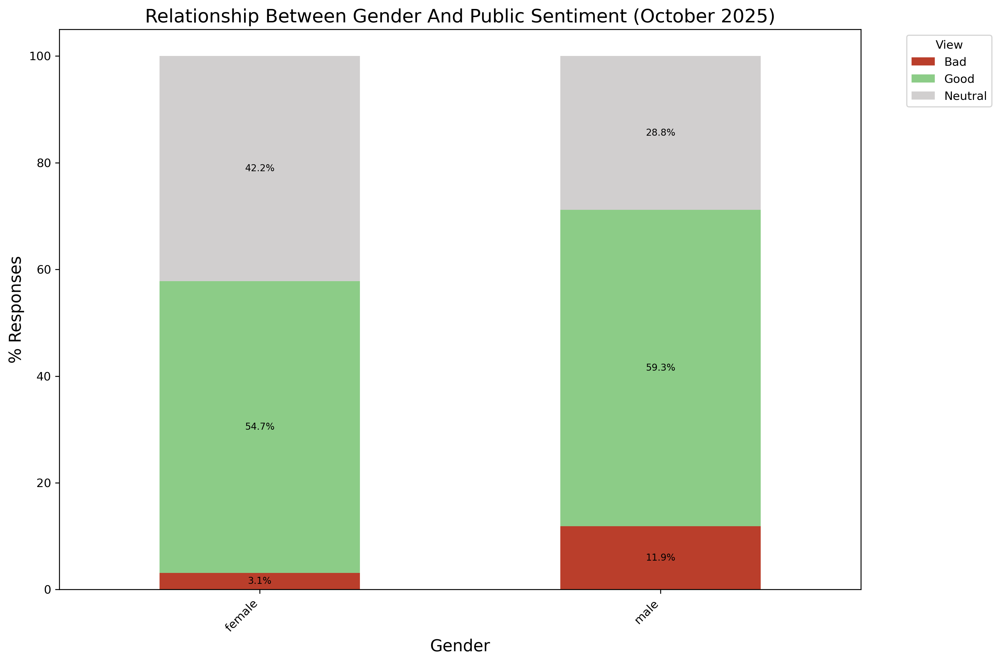

In [72]:
plot_stacked_bar_chart(
    df=oct25, 
    title='Relationship Between Gender And Public Sentiment (October 2025)',
    xlabel='Gender',
    ylabel='% Responses',
    cat_col= 'Gender',
    sent_col='How do you feel about Muslim people in America?'
)

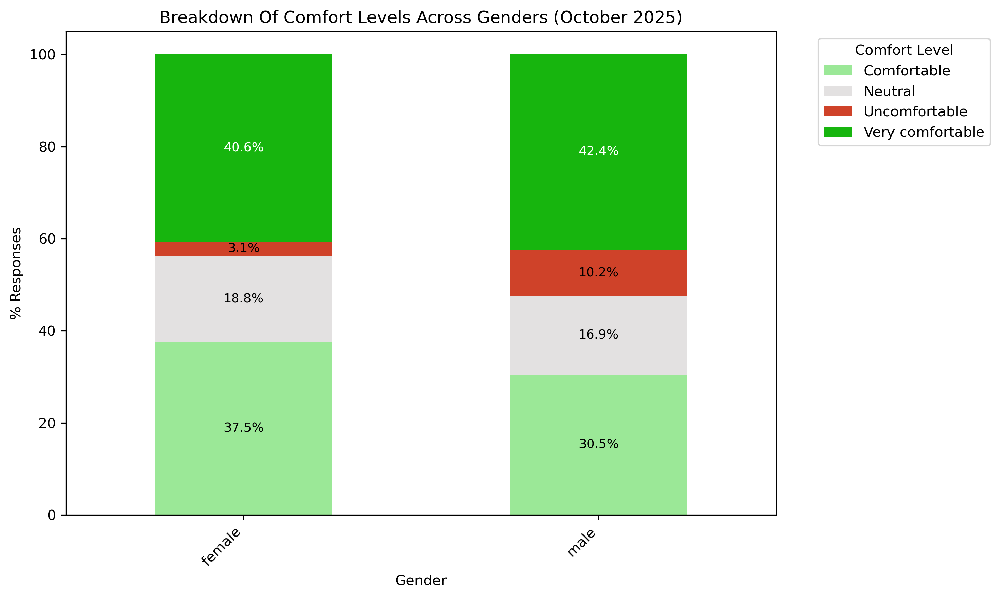

In [73]:
plot_comfort(
    df= oct25, 
    category_col= 'Gender',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Genders (October 2025)',
    xlabel='Gender',
    ylabel='% Responses',
)

## Educational Level Vs. Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/~45%_of_the_Survey_Participants_Went_to_Graduate_School_july_2025.png


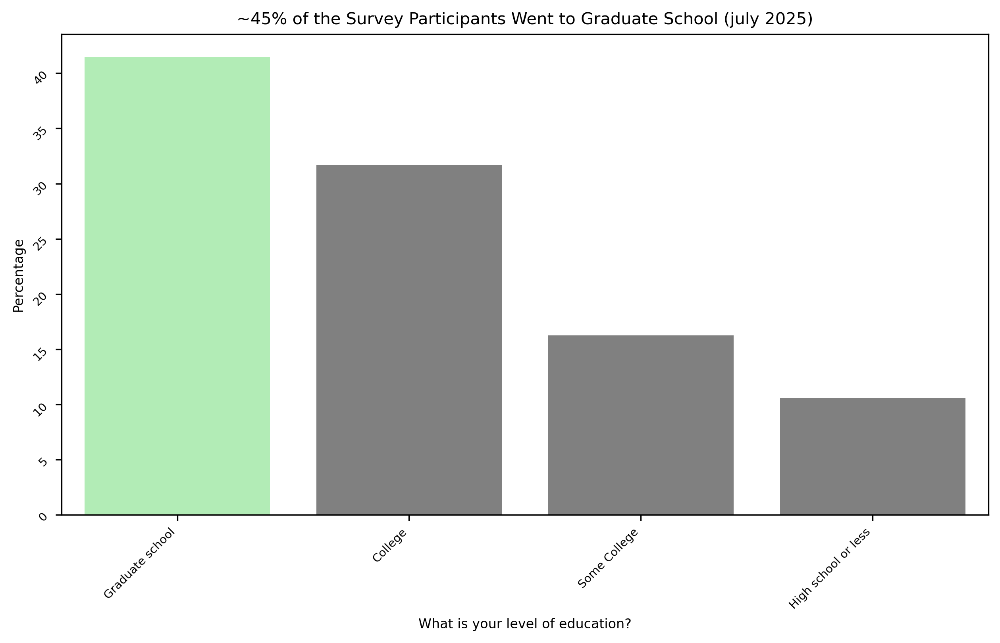

In [75]:
plot_percentages(oct25,'What is your level of education?', 'What is your level of education?',
           '~45% of the Survey Participants Went to Graduate School (july 2025)')

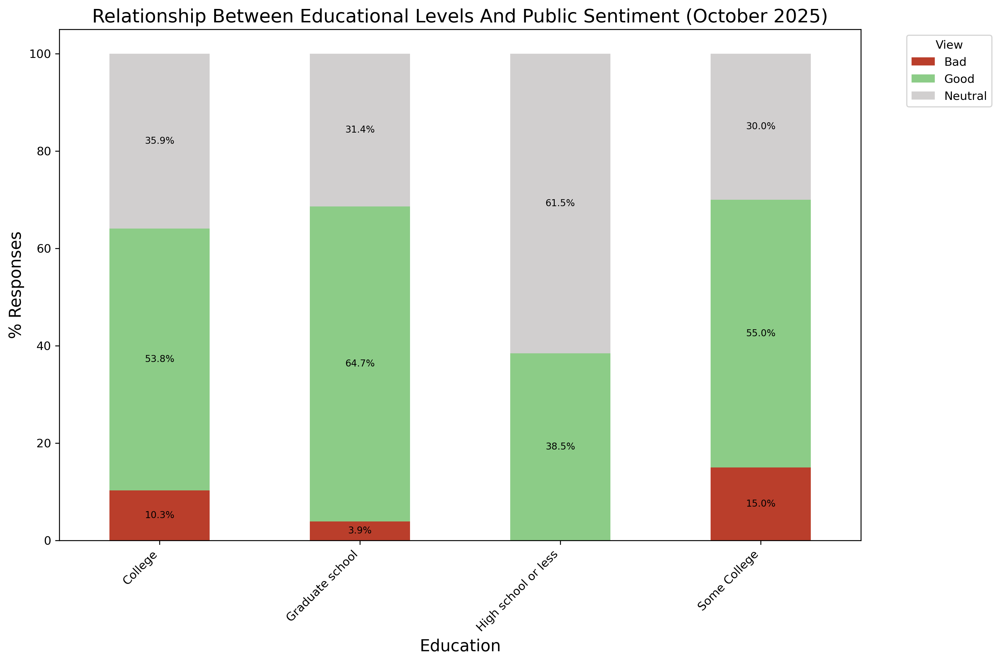

In [76]:
plot_stacked_bar_chart(
    df=oct25, 
    title='Relationship Between Educational Levels And Public Sentiment (October 2025)',
    xlabel='Education',
    ylabel='% Responses',
    cat_col= 'What is your level of education?',
    sent_col='How do you feel about Muslim people in America?'
)

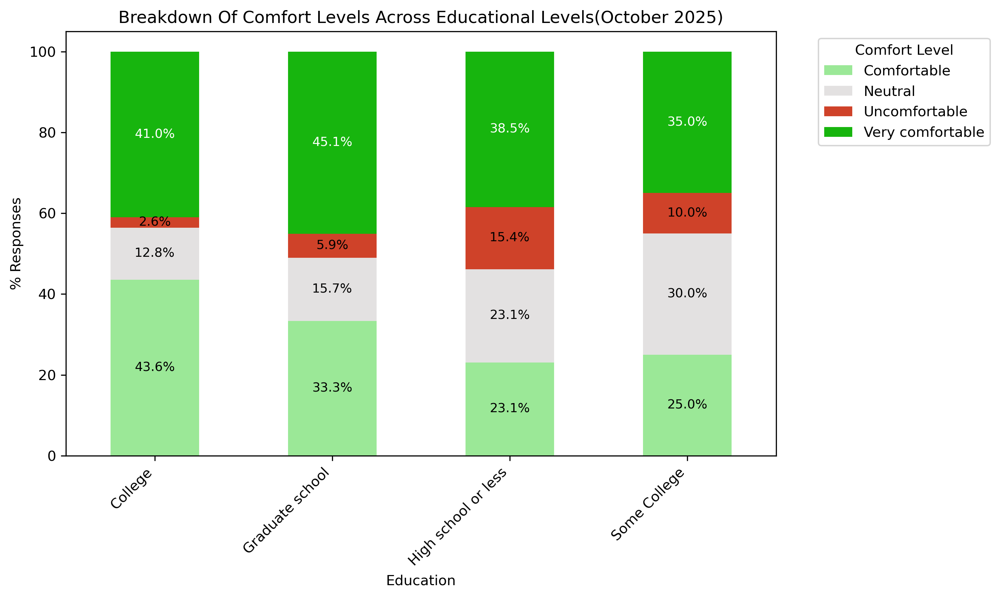

In [77]:
plot_comfort(
    df= oct25, 
    category_col= 'What is your level of education?',
    comfort_level = 'How comfortable do you feel interacting with Muslims in your community?',
    title='Breakdown Of Comfort Levels Across Educational Levels(October 2025)',
    xlabel='Education',
    ylabel='% Responses',
)

## Relationship Between Event Exposure and Overall Sentiment

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Distribution_Of_Exposure_to_Muslim-Sponsored_Events.png


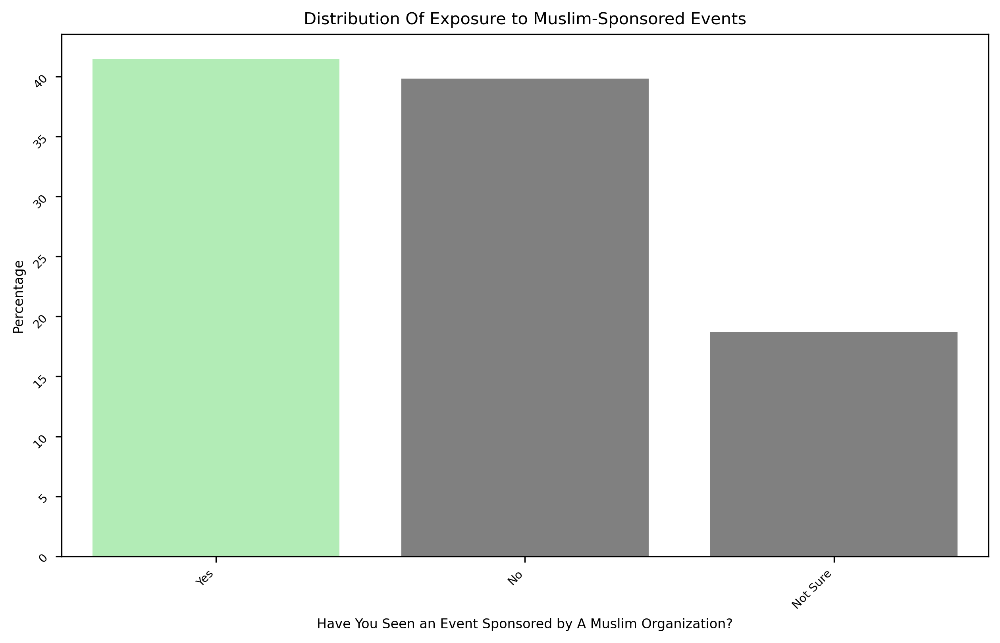

In [78]:
column_name= 'In the last 30 days, have you come across any events or activities \
sponsored by a Muslim person or organization?'
df= oct25
x_label= "Have You Seen an Event Sponsored by A Muslim Organization?"
title= "Distribution Of Exposure to Muslim-Sponsored Events"
    
plot_percentages(df, column_name, x_label, title)

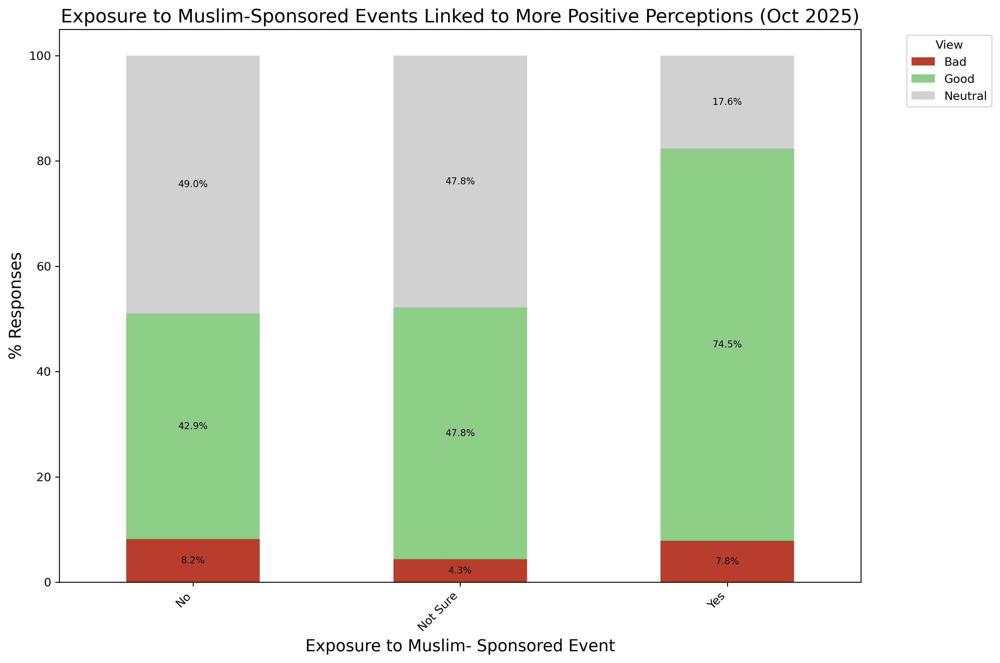

In [79]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Exposure to Muslim-Sponsored Events Linked to More Positive Perceptions (Oct 2025)",
    xlabel='Exposure to Muslim- Sponsored Event',
    ylabel='% Responses',
    cat_col= column_name,
    sent_col='How do you feel about Muslim people in America?'
)

In [80]:
grouped = (
    oct25.groupby(['What is your religion?', column_name, 'How do you feel about Muslim people in America?'])
    .size()
    .reset_index(name='count')
)

# Normalize within each religion + exposure group to get percentages
grouped['percent'] = grouped.groupby(['What is your religion?', column_name])['count'].\
transform(lambda x: 100 * x / x.sum())

Text(0.5, 0.98, 'Perceptions of Muslims by Exposure and Religious Affiliation (October 2025)')

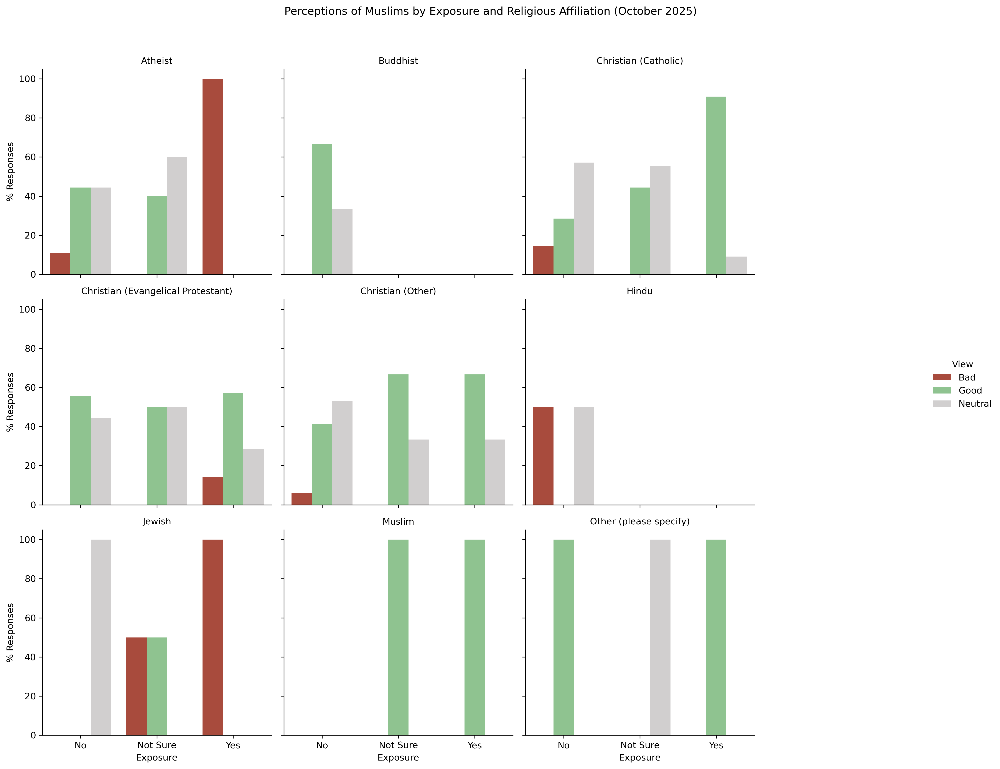

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.catplot(
    data=grouped,
    kind='bar',
    x=column_name,
    y='percent',
    hue='How do you feel about Muslim people in America?',
    col='What is your religion?',
    col_wrap=3,
    height=4,
    palette={'Good': '#86cc87', 'Neutral': '#d1cfcf', 'Bad': '#ba3e2b'}
)

g.set_titles("{col_name}")
g.set_axis_labels("Exposure", "% Responses")
g._legend.set_title("View")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Perceptions of Muslims by Exposure and Religious Affiliation (October 2025)")

# Level of Engagement with Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/More_90%_of_the_Survey_Participants_Are_Comfortable_Buying_From_Muslims_October_2025.png


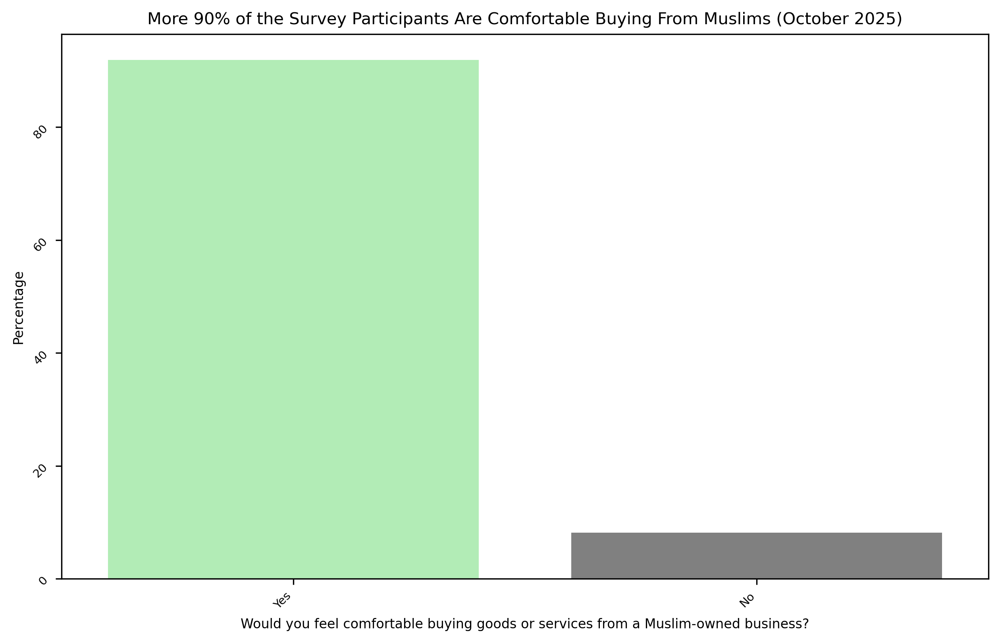

In [84]:
plot_percentages(oct25,'Would you feel comfortable buying goods or services from a Muslim-owned business?',\
                 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
           'More 90% of the Survey Participants Are Comfortable Buying From Muslims (October 2025)')

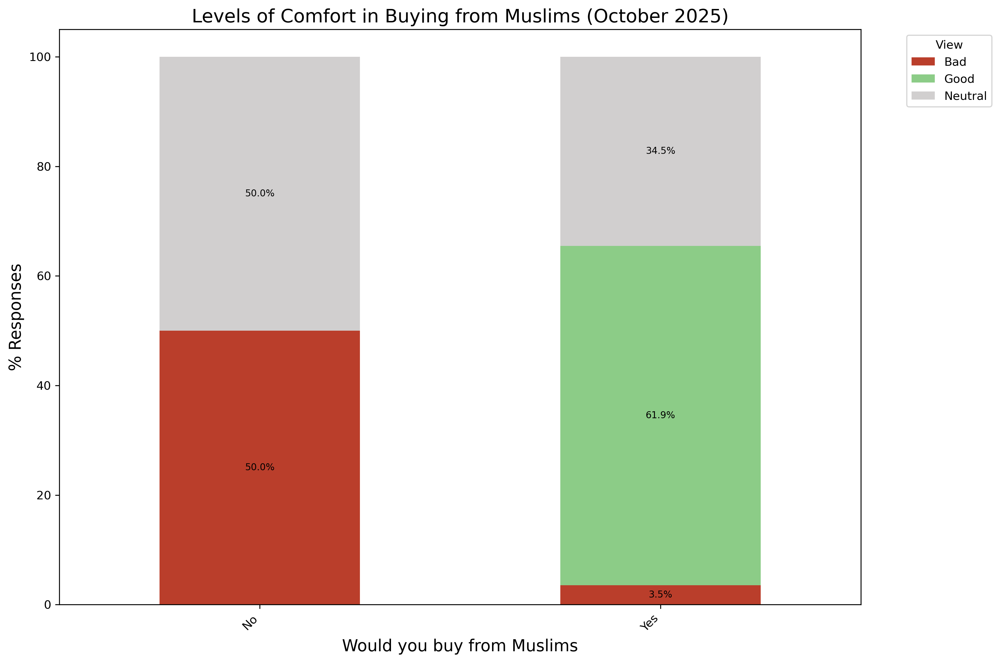

In [85]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Levels of Comfort in Buying from Muslims (October 2025)",
    xlabel='Would you buy from Muslims',
    ylabel='% Responses',
    cat_col= 'Would you feel comfortable buying goods or services from a Muslim-owned business?',
    sent_col='How do you feel about Muslim people in America?'
)

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/53%_of_the_Survey_Participants_Are_Comfortable_Visting_A_Mosque_October_2025.png


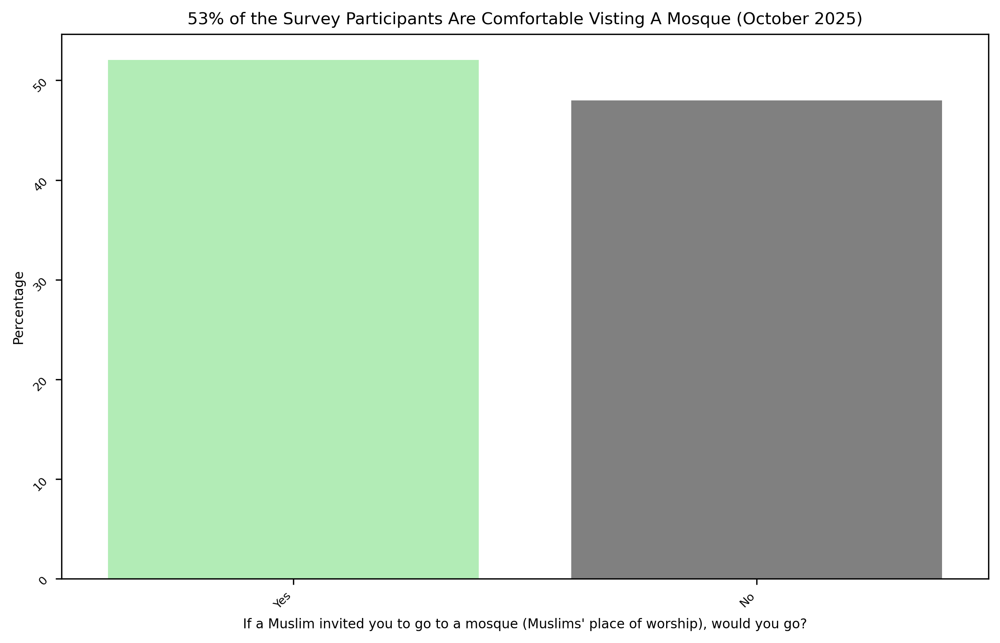

In [88]:
plot_percentages(oct25,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",\
                 "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
           "53% of the Survey Participants Are Comfortable Visting A Mosque (October 2025)")

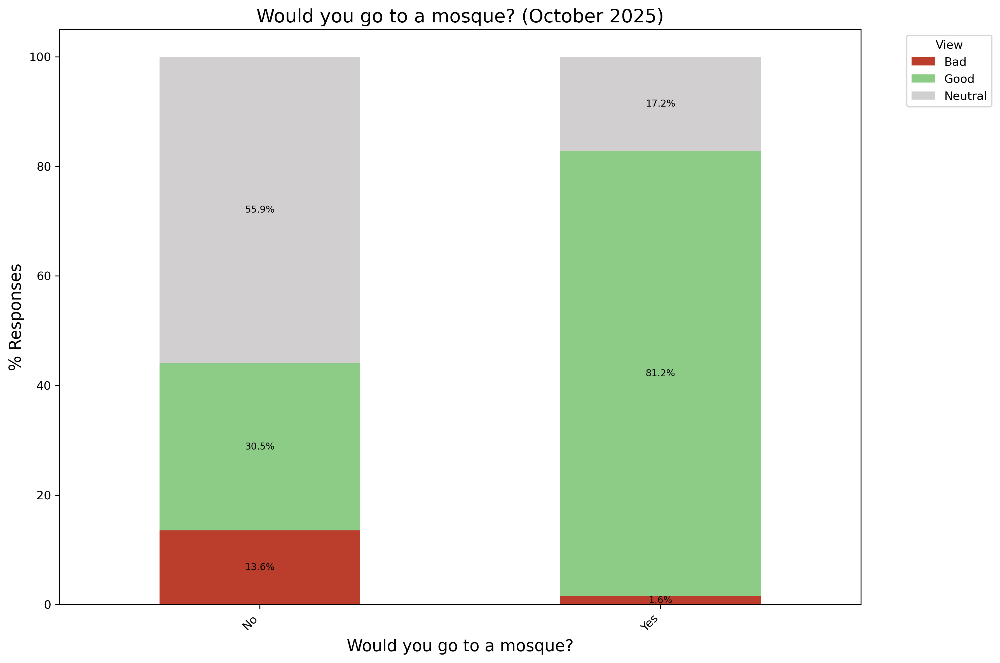

In [89]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Would you go to a mosque? (October 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    sent_col='How do you feel about Muslim people in America?'
)

# Characteristics of Those Who Answered No

## “What religions/gender/income group...etc do the ‘No’ respondents belong to?”

In [90]:
def summarize_group(df, columns):
    """
    Returns a DataFrame summarizing the percentage distribution
    of each unique value in the selected columns.

    Parameters:
    - df: The filtered DataFrame (e.g., those who said "No" to visiting a mosque)
    - columns: List of column names to summarize

    Returns:
    - Dictionary of DataFrames for each column
    """
    summary_tables = {}
    for col in columns:
        summary = df[col].value_counts(normalize=True, dropna=False).mul(100).round(1).rename("Percentage")
        summary_tables[col] = summary.to_frame()
    return summary_tables


In [91]:
no_mosque = oct25[
    oct25["If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?"] == "No"
]

columns_to_summarize = [
    "What is your religion?",
    "Age",
    "Household_Income",
    "Major US Region",
    "Gender",
    "Where do you get your news from?",
    "How do you feel about Muslim people in America?",
    "In the last 30 days, have you come across any events or activities sponsored by a Muslim person or organization?",
    "How would you rate your own understanding of Muslim religious practices (e.g., Ramadan, daily prayers)?",
    "Do you feel you have a lot in common with Muslims in America?",
    "If you had questions about Islam or Muslims, where would you go to learn more?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally"
    
]

summary_results = summarize_group(no_mosque, columns_to_summarize)


In [94]:
print("=======Religion==========")
summary_results["What is your religion?"]
print("=====Age=====")
summary_results["Age"]
print("====Gender======")
summary_results["Gender"]
print("====News======")
summary_results["Where do you get your news from?"]

=======Religion==========


,Percentage
Christian (Evangelical Protestant),30.5
Christian (Other),27.1
Christian (Catholic),18.6
Atheist,16.9
Jewish,3.4
Hindu,1.7
Other (please specify),1.7


=====Age=====


,Percentage
30_to_44,40.7
60_above,25.4
45_to_60,22.0
18_to_29,11.9


====Gender======


,Percentage
female,59.3
male,40.7


====News======


,Percentage
Other (please specify),23.7
Facebook,15.3
Youtube,11.9
FOX News,11.9
Google News,10.2
NPR,8.5
CNN,8.5
Twitter,6.8
Reddit,3.4


Of everyone who said "No", 18.6% were Catholic, 27.1% were "Christian (Other)", 16.9% were atheists.

## “What proportion within each religious group said they wouldn’t go to the mosque?”

To avoid misinterpretation, without normalizing by group size, large groups (like Catholics) may dominate the "No" responses just because there are more of them — not because they are more likely to say "No."

In [95]:
def normalize_by_group( df, col, mosque):
    summary = pd.crosstab(
    df[col],
    df[mosque],
    normalize='index'
).mul(100).round(1)
    return summary

In [96]:
normalize_by_group(oct25,"What is your religion?"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
What is your religion?,,
Atheist,66.7,33.3
Buddhist,0.0,100.0
Christian (Catholic),28.9,71.1
Christian (Evangelical Protestant),72.0,28.0
Christian (Other),55.2,44.8
Hindu,50.0,50.0
Jewish,50.0,50.0
Muslim,0.0,100.0
Other (please specify),33.3,66.7


In [97]:
normalize_by_group(oct25,"Age"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
Age,,
18_to_29,43.8,56.2
30_to_44,46.2,53.8
45_to_60,37.1,62.9
60_above,75.0,25.0


In [98]:
normalize_by_group(oct25,"Where do you get your news from?"\
                   , "If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?")

"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",No,Yes
Where do you get your news from?,,
CNN,33.3,66.7
FOX News,46.7,53.3
Facebook,36.0,64.0
Google News,85.7,14.3
NPR,71.4,28.6
Other (please specify),56.0,44.0
Reddit,40.0,60.0
Twitter,30.8,69.2
Youtube,63.6,36.4


In [101]:
normalize_by_group(oct25,"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",
    "Have you ever changed your opinion about a group of people after getting to know someone personally")

Have you ever changed your opinion about a group of people after getting to know someone personally,No,Not sure,Yes
"If a Muslim invited you to go to a mosque (Muslims' place of worship), would you go?",,,
No,30.5,28.8,40.7
Yes,15.6,7.8,76.6


# Common Grounds With Muslims

Saving plot to: /Users/manelmahroug/Desktop/Muslim-Brand-Sentiment/scripts/../images/Close_to_30%_of_Survey_Participants_Feel_They_Do_Not_Have_A_Lot_In_Common_With_Muslims_October_2025.png


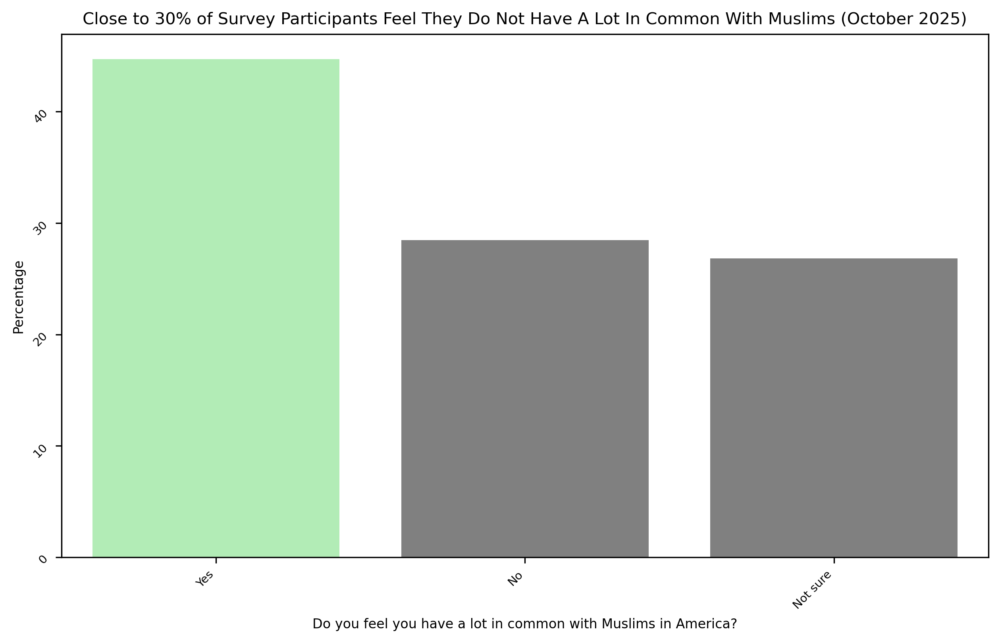

In [104]:
plot_percentages(oct25,'Do you feel you have a lot in common with Muslims in America?',\
                 'Do you feel you have a lot in common with Muslims in America?',
           'Close to 30% of Survey Participants Feel They Do Not Have A Lot In Common With Muslims (October 2025)')

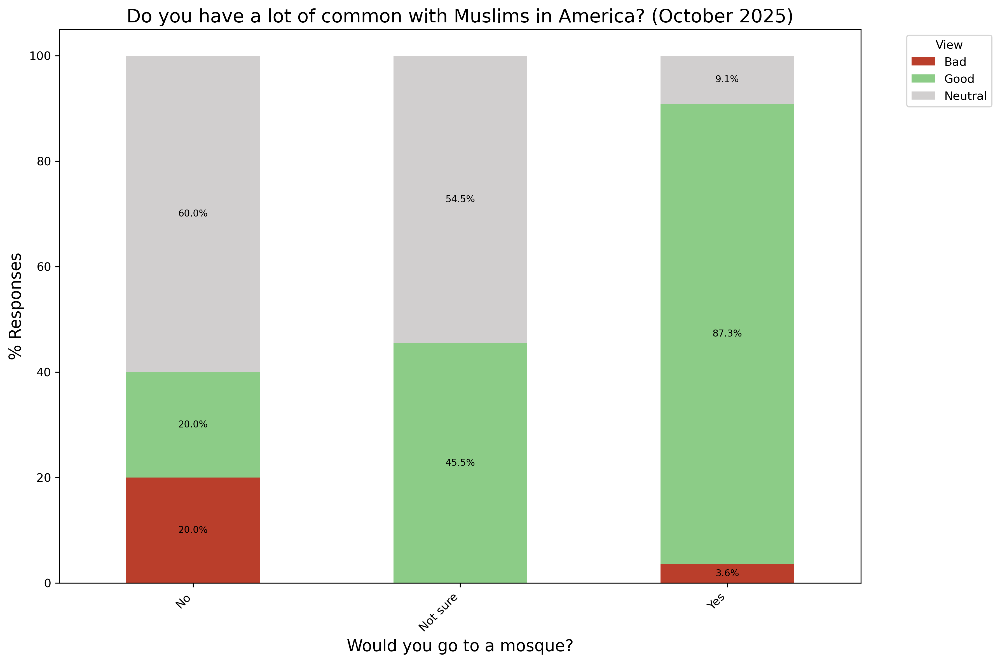

In [106]:
plot_stacked_bar_chart(
    df=oct25, 
    title="Do you have a lot of common with Muslims in America? (October 2025)",
    xlabel='Would you go to a mosque?',
    ylabel='% Responses',
    cat_col= "Do you feel you have a lot in common with Muslims in America?",
    sent_col='How do you feel about Muslim people in America?'
)